## Load data and import neccessary library

In [12]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns   
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [13]:
path = r'C:\Users\ADMIN\OneDrive\Documents\_Project\AIL303m\weatherAUS.csv'
data = pd.read_csv(path)
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


## Check information or describe of data

In [14]:
# Print basic information about the dataset
print('Data Information:')
data.info()

Data Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am   

In [15]:
print('Description of Data:')
data.describe()

Description of Data:


,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [16]:
# Check for missing values and percentages value missing
missing_values = data.isnull().sum()
missing_percentage = (missing_values / len(data)) * 100
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})
print('Missing Data:')
print(missing_data)

Missing Data:
               Missing Values  Percentage
Date                        0    0.000000
Location                    0    0.000000
MinTemp                  1485    1.020899
MaxTemp                  1261    0.866905
Rainfall                 3261    2.241853
Evaporation             62790   43.166506
Sunshine                69835   48.009762
WindGustDir             10326    7.098859
WindGustSpeed           10263    7.055548
WindDir9am              10566    7.263853
WindDir3pm               4228    2.906641
WindSpeed9am             1767    1.214767
WindSpeed3pm             3062    2.105046
Humidity9am              2654    1.824557
Humidity3pm              4507    3.098446
Pressure9am             15065   10.356799
Pressure3pm             15028   10.331363
Cloud9am                55888   38.421559
Cloud3pm                59358   40.807095
Temp9am                  1767    1.214767
Temp3pm                  3609    2.481094
RainToday                3261    2.241853
RainTomorrow        

In [17]:
#drop columns with too many missing values
data = data.drop(columns=['Evaporation', 'Sunshine', 'Cloud9am', 'Cloud3pm'])   
data 

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,15.1,26.0,No,No


In [18]:
# Split categorical and numerical columns
categorical_cols = data.select_dtypes(include=['object']).columns
numerical_cols = data.select_dtypes(include=['number']).columns
print('Categorical Columns:', categorical_cols)
print('Numerical Columns:', numerical_cols)

Categorical Columns: Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')
Numerical Columns: Index(['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
       'Pressure3pm', 'Temp9am', 'Temp3pm'],
      dtype='object')


In [19]:
# using linear interpolation to fill missing values in numerical columns
data[numerical_cols] = data[numerical_cols].interpolate(method='linear', limit_direction='both')
# using mode to fill missing values in categorical columns
for col in categorical_cols:
    mode_value = data[col].mode()[0]
    data[col].fillna(mode_value, inplace=True)
# Verify that there are no more missing values
print('Missing Values After Imputation:')
print(data.isnull().sum())

Missing Values After Imputation:
Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15768\1928688359.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(mode_value, inplace=True)


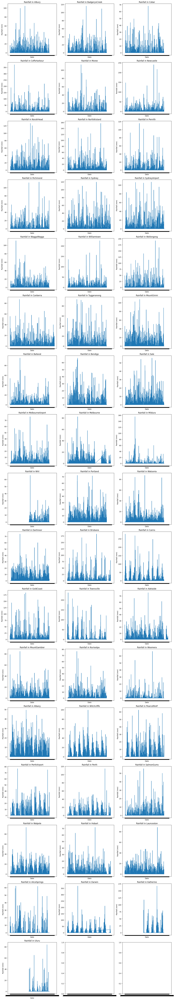

In [20]:
# unsing subplots to visualize time series data of all regional rainfall
regions = data['Location'].unique()
num_regions = len(regions)
cols = 3
rows = (num_regions // cols) + (num_regions % cols > 0)
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows), sharex=True)
for i, region in enumerate(regions):
    ax = axes[i // cols, i % cols]
    region_data = data[data['Location'] == region]
    ax.plot(region_data['Date'], region_data['Rainfall'])
    ax.set_title(f'Rainfall in {region}')
    ax.set_xlabel('Date')
    ax.set_ylabel('Rainfall (mm)')
plt.tight_layout()
plt.show()

## Phân tích Missing Data theo từng thành phố

In [21]:
# Load lại data gốc để phân tích missing values theo thành phố
data_original = pd.read_csv(path)
print(f"Data shape: {data_original.shape}")
print(f"Số thành phố: {data_original['Location'].nunique()}")
print(f"Các thành phố: {data_original['Location'].unique()}")

Data shape: (145460, 23)
Số thành phố: 49
Các thành phố: ['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Wollongong' 'Canberra' 'Tuggeranong'
 'MountGinini' 'Ballarat' 'Bendigo' 'Sale' 'MelbourneAirport' 'Melbourne'
 'Mildura' 'Nhil' 'Portland' 'Watsonia' 'Dartmoor' 'Brisbane' 'Cairns'
 'GoldCoast' 'Townsville' 'Adelaide' 'MountGambier' 'Nuriootpa' 'Woomera'
 'Albany' 'Witchcliffe' 'PearceRAAF' 'PerthAirport' 'Perth' 'SalmonGums'
 'Walpole' 'Hobart' 'Launceston' 'AliceSprings' 'Darwin' 'Katherine'
 'Uluru']


In [22]:
# Tính phần trăm missing data cho từng cột của từng thành phố
missing_by_city = {}

for location in data_original['Location'].unique():
    city_data = data_original[data_original['Location'] == location]
    missing_pct = (city_data.isnull().sum() / len(city_data)) * 100
    missing_by_city[location] = missing_pct

# Tạo DataFrame từ dictionary
missing_df = pd.DataFrame(missing_by_city).T
print("Missing data percentage by city:")
print(missing_df.head())

Missing data percentage by city:
               Date  Location   MinTemp   MaxTemp  Rainfall  Evaporation  \
Albury          0.0       0.0  0.361842  0.361842  0.953947   100.000000   
BadgerysCreek   0.0       0.0  1.196411  0.963775  2.691924   100.000000   
Cobar           0.0       0.0  0.199402  0.099701  0.697906    11.399136   
CoffsHarbour    0.0       0.0  0.498504  0.631439  1.861083    40.677966   
Moree           0.0       0.0  0.066467  0.000000  5.151213    23.828514   

                 Sunshine  WindGustDir  WindGustSpeed  WindDir9am  ...  \
Albury         100.000000     1.052632       1.052632   17.269737  ...   
BadgerysCreek  100.000000     2.525756       2.525756   14.456630  ...   
Cobar           81.721502     1.395813       1.395813    0.897308  ...   
CoffsHarbour    50.348953    11.930874      11.930874   11.532070  ...   
Moree           31.704885     2.592223       2.558990    3.589232  ...   

               Humidity9am  Humidity3pm  Pressure9am  Pressure3pm

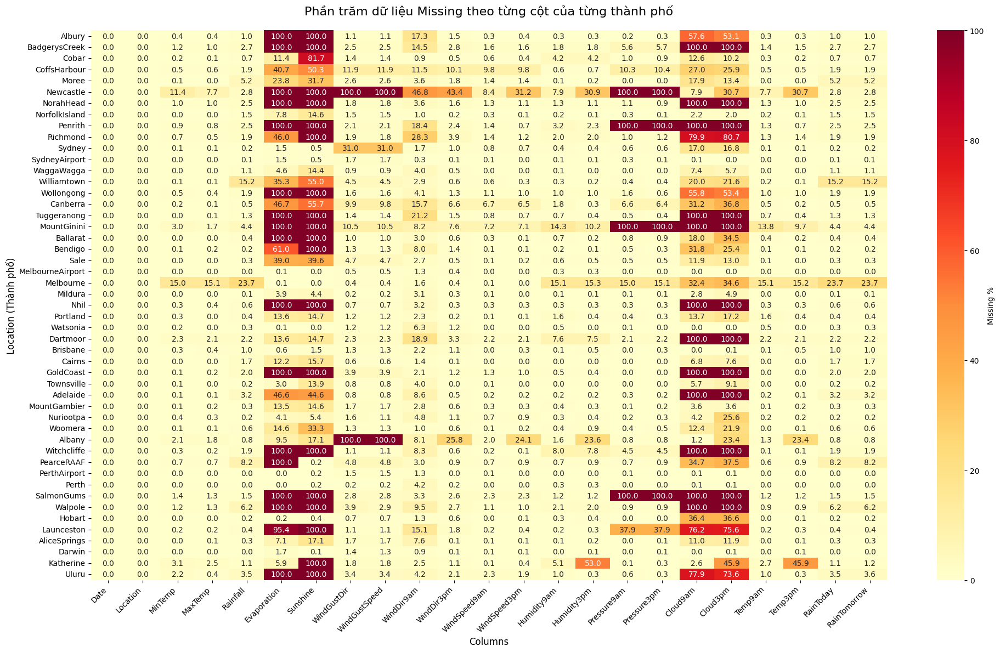

In [23]:
# Visualize missing data - Heatmap cho tất cả các thành phố
plt.figure(figsize=(20, 12))
sns.heatmap(missing_df, annot=True, fmt='.1f', cmap='YlOrRd', cbar_kws={'label': 'Missing %'})
plt.title('Phần trăm dữ liệu Missing theo từng cột của từng thành phố', fontsize=16, pad=20)
plt.xlabel('Columns', fontsize=12)
plt.ylabel('Location (Thành phố)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

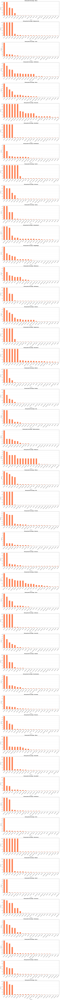

In [24]:
# Visualize top columns với missing data cao nhất
# Lấy các cột có missing data (loại bỏ các cột không có missing)
cols_with_missing = missing_df.columns[missing_df.sum() > 0]
missing_df_filtered = missing_df[cols_with_missing]

# Tạo bar plot cho từng thành phố
num_cities = len(missing_df_filtered)
fig, axes = plt.subplots(num_cities, 1, figsize=(15, 5 * num_cities))

if num_cities == 1:
    axes = [axes]

for idx, city in enumerate(missing_df_filtered.index):
    ax = axes[idx]
    city_missing = missing_df_filtered.loc[city].sort_values(ascending=False)
    city_missing.plot(kind='bar', ax=ax, color='coral')
    ax.set_title(f'Missing Data Percentage - {city}', fontsize=12, fontweight='bold')
    ax.set_xlabel('Columns')
    ax.set_ylabel('Missing %')
    ax.tick_params(axis='x', rotation=45)
    ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

In [25]:
# Tạo summary statistics cho missing data theo thành phố
print("=== SUMMARY STATISTICS ===\n")
print("Tổng số missing data (%) theo từng thành phố:")
print(missing_df.mean(axis=1).sort_values(ascending=False))
print("\n" + "="*50 + "\n")
print("Tổng số missing data (%) theo từng cột:")
print(missing_df.mean(axis=0).sort_values(ascending=False))

=== SUMMARY STATISTICS ===

Tổng số missing data (%) theo từng thành phố:
Newcastle           37.952988
MountGinini         31.179920
Penrith             27.989756
SalmonGums          27.315533
BadgerysCreek       19.720548
Walpole             19.560878
Launceston          19.360698
Witchcliffe         19.237938
Tuggeranong         18.877777
NorahHead           18.583917
GoldCoast           18.293764
Nhil                17.818372
Uluru               16.760346
Albany              16.044050
Richmond            15.690609
Albury              14.666762
Wollongong          14.452231
Adelaide            13.612658
Dartmoor            12.783389
Katherine           12.101174
Ballarat            11.428776
Melbourne           11.394491
Canberra            10.579795
CoffsHarbour        10.380453
Bendigo             10.118707
PearceRAAF           9.483145
Williamtown          8.361871
Cobar                5.834670
Sale                 5.201786
Moree                5.042842
Sydney               4.574

## Phân tích mối quan hệ giữa các Features và Rainfall theo từng thành phố

=== CORRELATION ANALYSIS: Features vs Rainfall ===


Canberra - Top correlations with Rainfall:
Humidity3pm    0.262029
MinTemp        0.185510
Humidity9am    0.175908
Name: Rainfall, dtype: float64

Sydney - Top correlations with Rainfall:
Humidity9am     0.330838
Humidity3pm     0.301503
WindSpeed9am    0.155031
Name: Rainfall, dtype: float64

Adelaide - Top correlations with Rainfall:
Humidity3pm      0.348567
Humidity9am      0.345378
WindGustSpeed    0.191172
Name: Rainfall, dtype: float64

Darwin - Top correlations with Rainfall:
Humidity3pm      0.368376
Humidity9am      0.362102
WindGustSpeed    0.308429
Name: Rainfall, dtype: float64

Hobart - Top correlations with Rainfall:
Humidity3pm      0.217250
Humidity9am      0.176462
WindGustSpeed    0.159020
Name: Rainfall, dtype: float64

Perth - Top correlations with Rainfall:
Humidity9am      0.328610
Humidity3pm      0.320031
WindGustSpeed    0.234127
Name: Rainfall, dtype: float64

Melbourne - Top correlations with Rainfall:
Hum

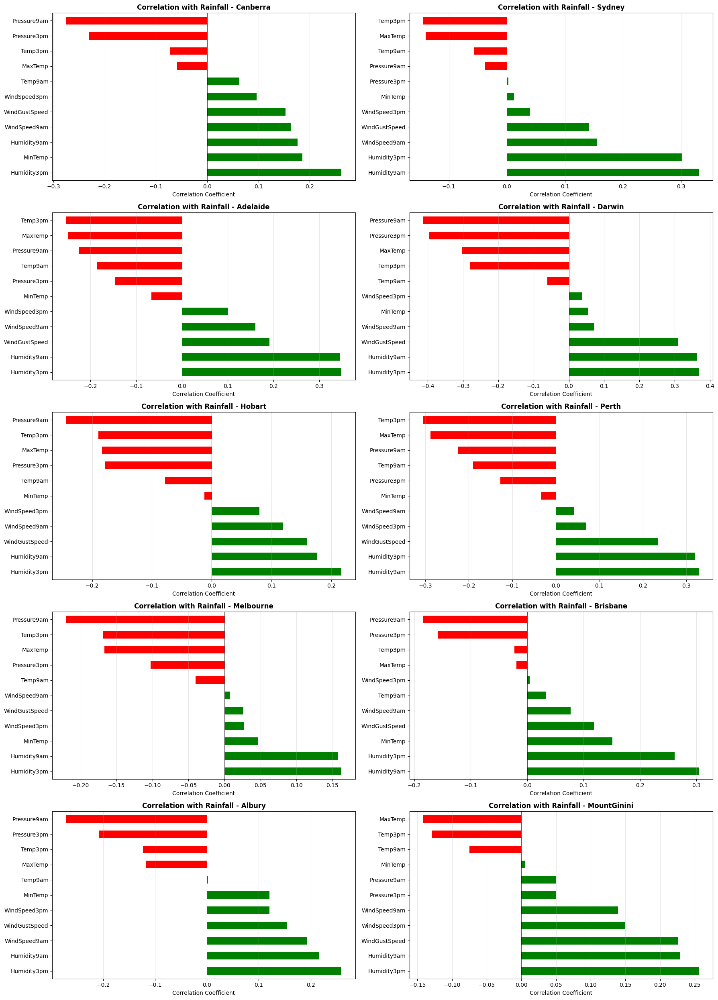

In [26]:
# 1. Correlation heatmap giữa các features số và Rainfall cho từng thành phố
print("=== CORRELATION ANALYSIS: Features vs Rainfall ===\n")

# Chọn các features số quan trọng
important_features = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 
                     'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
                     'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

# Lọc các features có trong data
available_features = [f for f in important_features if f in data.columns]

# Lấy 10 thành phố có nhiều dữ liệu nhất
top_cities = data['Location'].value_counts().head(10).index

fig, axes = plt.subplots(5, 2, figsize=(18, 25))
axes = axes.flatten()

for idx, city in enumerate(top_cities):
    city_data = data[data['Location'] == city][available_features]
    correlation = city_data.corr()['Rainfall'].sort_values(ascending=False)
    
    ax = axes[idx]
    colors = ['green' if x > 0 else 'red' for x in correlation.values]
    correlation.drop('Rainfall').plot(kind='barh', ax=ax, color=colors[1:])
    ax.set_title(f'Correlation with Rainfall - {city}', fontsize=12, fontweight='bold')
    ax.set_xlabel('Correlation Coefficient')
    ax.axvline(x=0, color='black', linestyle='-', linewidth=0.5)
    ax.grid(axis='x', alpha=0.3)
    
    # In ra top 3 correlations
    print(f"\n{city} - Top correlations with Rainfall:")
    print(correlation.drop('Rainfall').head(3))

plt.tight_layout()
plt.show()

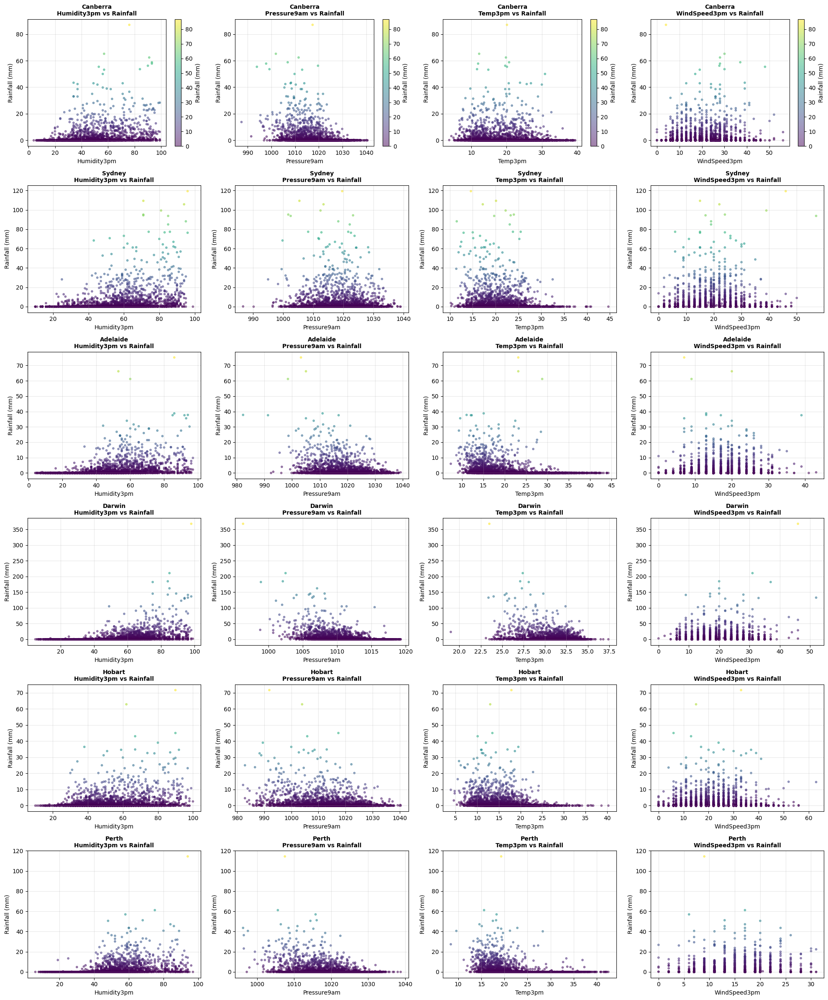

In [27]:
# 2. Scatter plots: Rainfall vs các features quan trọng nhất theo từng thành phố
# Chọn 6 thành phố để visualize
selected_cities = data['Location'].value_counts().head(6).index

# Các features để plot
features_to_plot = ['Humidity3pm', 'Pressure9am', 'Temp3pm', 'WindSpeed3pm']

fig, axes = plt.subplots(len(selected_cities), len(features_to_plot), 
                        figsize=(20, 4*len(selected_cities)))

for i, city in enumerate(selected_cities):
    city_data = data[data['Location'] == city]
    
    for j, feature in enumerate(features_to_plot):
        ax = axes[i, j]
        
        # Scatter plot với color gradient theo Rainfall
        scatter = ax.scatter(city_data[feature], city_data['Rainfall'], 
                           c=city_data['Rainfall'], cmap='viridis', alpha=0.5, s=10)
        
        ax.set_xlabel(feature, fontsize=10)
        ax.set_ylabel('Rainfall (mm)', fontsize=10)
        ax.set_title(f'{city}\n{feature} vs Rainfall', fontsize=10, fontweight='bold')
        ax.grid(alpha=0.3)
        
        # Thêm colorbar cho hàng đầu tiên
        if i == 0:
            plt.colorbar(scatter, ax=ax, label='Rainfall (mm)')

plt.tight_layout()
plt.show()

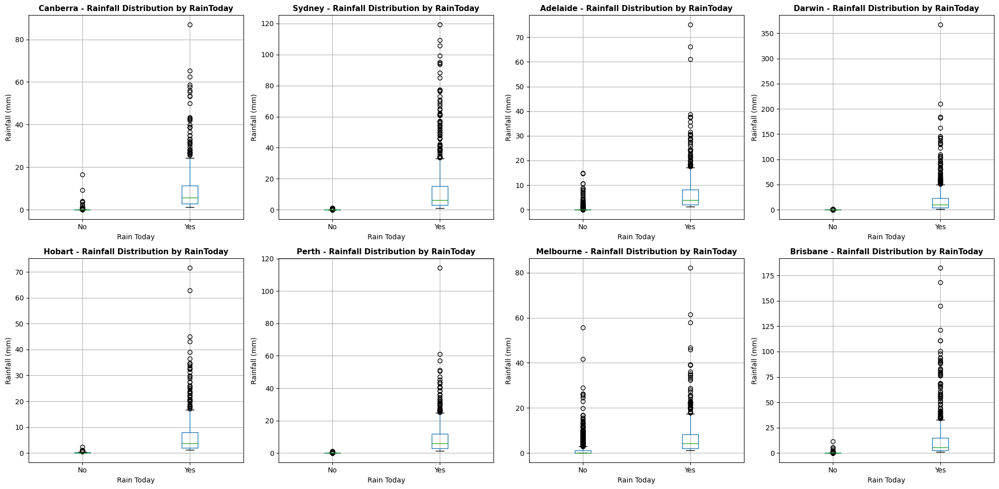

In [28]:
# 3. Box plots: Phân bố Rainfall theo các categorical features (RainToday) cho từng thành phố
selected_cities = data['Location'].value_counts().head(8).index

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Box plot cho RainToday vs Rainfall
    city_data.boxplot(column='Rainfall', by='RainToday', ax=ax)
    ax.set_title(f'{city} - Rainfall Distribution by RainToday', fontsize=11, fontweight='bold')
    ax.set_xlabel('Rain Today')
    ax.set_ylabel('Rainfall (mm)')
    plt.sca(ax)
    plt.xticks(rotation=0)
    
plt.suptitle('')  # Remove default title
plt.tight_layout()
plt.show()

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15768\2699600678.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=city_data, x='WindDir3pm', y='Rainfall', ax=ax, palette='Set2')
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15768\2699600678.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=city_data, x='WindDir3pm', y='Rainfall', ax=ax, palette='Set2')
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15768\2699600678.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=city_data, x='WindDir3pm', y='Rainfall', ax=ax, palet

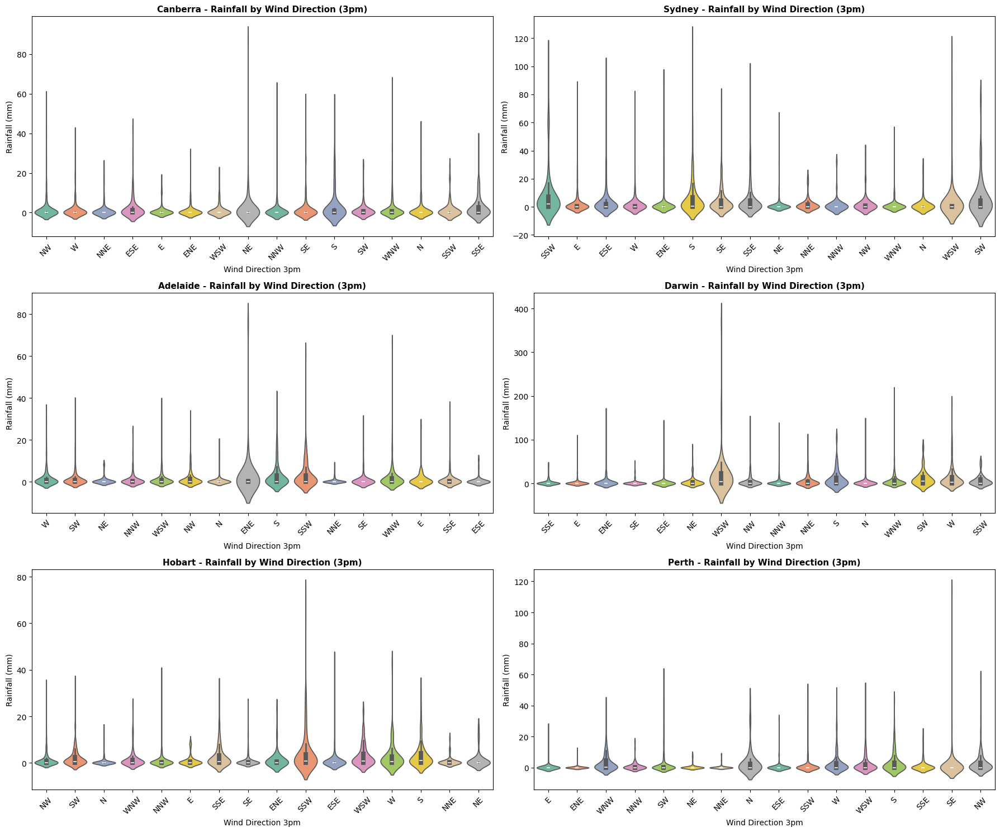

In [29]:
# 4. Violin plots: Phân bố Rainfall theo Wind Direction cho từng thành phố
selected_cities = data['Location'].value_counts().head(6).index

fig, axes = plt.subplots(3, 2, figsize=(18, 15))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Violin plot cho WindDir3pm vs Rainfall
    sns.violinplot(data=city_data, x='WindDir3pm', y='Rainfall', ax=ax, palette='Set2')
    ax.set_title(f'{city} - Rainfall by Wind Direction (3pm)', fontsize=11, fontweight='bold')
    ax.set_xlabel('Wind Direction 3pm')
    ax.set_ylabel('Rainfall (mm)')
    ax.tick_params(axis='x', rotation=45)
    
plt.tight_layout()
plt.show()

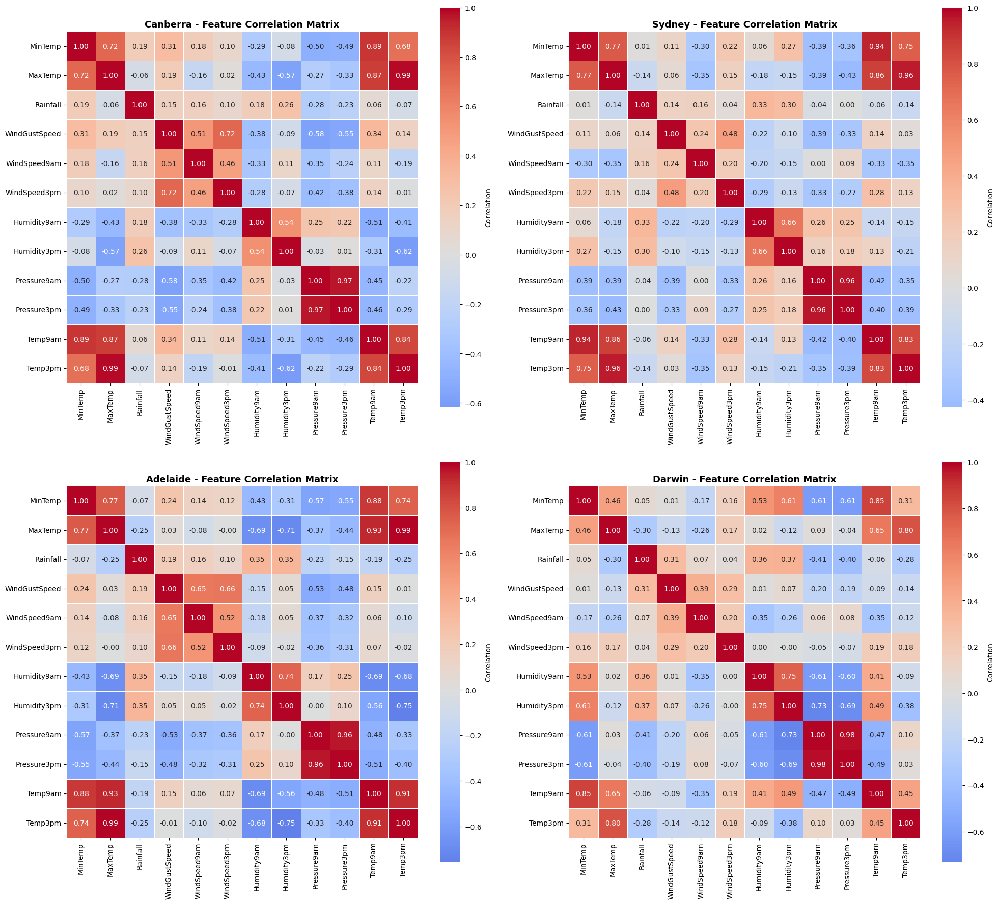

In [30]:
# 5. Heatmap: Correlation matrix đầy đủ cho các thành phố chính
selected_cities = data['Location'].value_counts().head(4).index

fig, axes = plt.subplots(2, 2, figsize=(20, 18))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city][available_features]
    
    # Tạo correlation matrix
    corr_matrix = city_data.corr()
    
    # Heatmap
    sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', 
                center=0, ax=ax, square=True, linewidths=0.5,
                cbar_kws={'label': 'Correlation'})
    ax.set_title(f'{city} - Feature Correlation Matrix', fontsize=13, fontweight='bold')
    
plt.tight_layout()
plt.show()

Pair Plot Analysis for Canberra (sample of 1000 records)


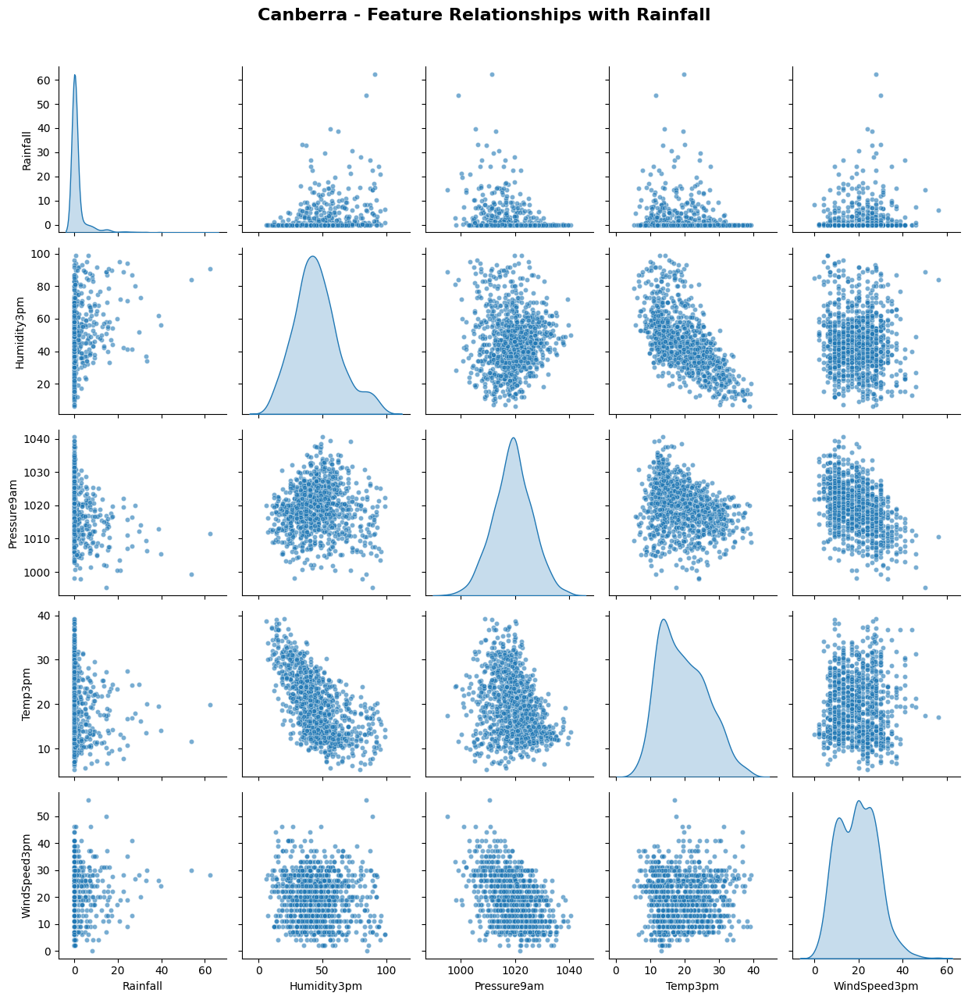

In [31]:
# 6. Pair plot: Mối quan hệ giữa top features và Rainfall cho một thành phố mẫu
# Chọn thành phố có nhiều data nhất
main_city = data['Location'].value_counts().index[0]
city_sample = data[data['Location'] == main_city].sample(n=min(1000, len(data[data['Location'] == main_city])))

# Chọn features quan trọng nhất
top_features = ['Rainfall', 'Humidity3pm', 'Pressure9am', 'Temp3pm', 'WindSpeed3pm']

print(f"Pair Plot Analysis for {main_city} (sample of {len(city_sample)} records)")
pair_plot = sns.pairplot(city_sample[top_features], 
                         diag_kind='kde', 
                         plot_kws={'alpha': 0.6, 's': 20},
                         corner=False)
pair_plot.fig.suptitle(f'{main_city} - Feature Relationships with Rainfall', 
                       y=1.02, fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

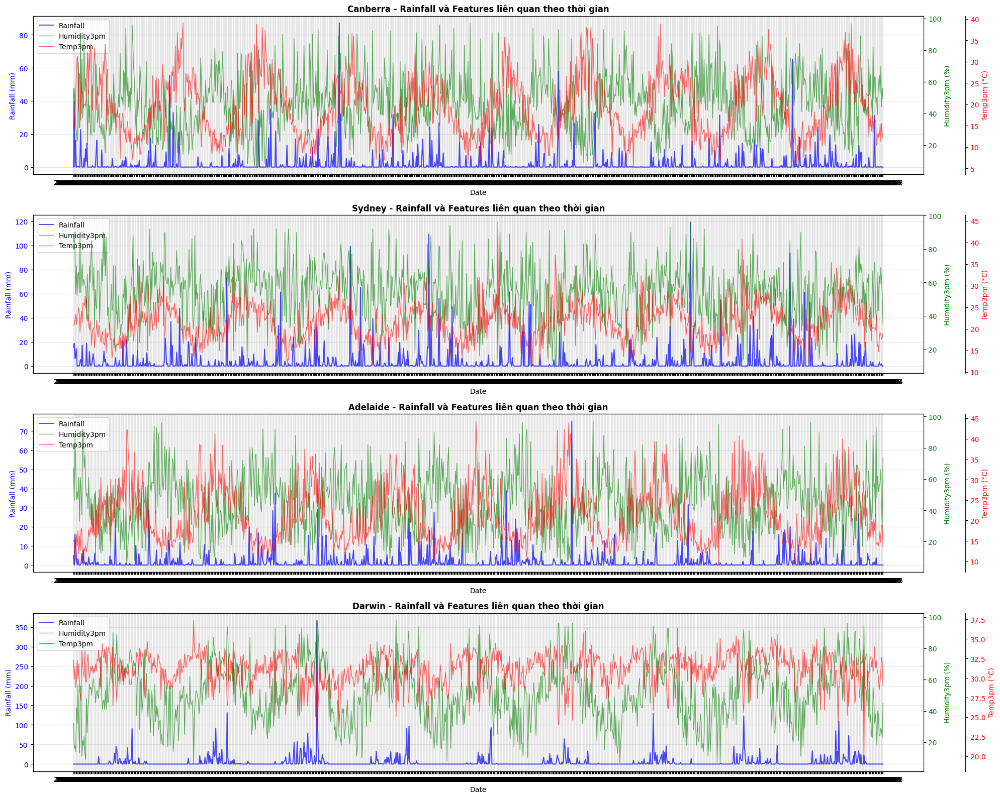

In [32]:
# 7. Time series: Rainfall và các features quan trọng theo thời gian cho từng thành phố
selected_cities = data['Location'].value_counts().head(4).index

fig, axes = plt.subplots(4, 1, figsize=(20, 16))

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city].sort_values('Date')
    
    # Lấy sample để không quá đông
    if len(city_data) > 1000:
        city_data = city_data.iloc[::len(city_data)//1000]
    
    # Plot multiple features
    ax2 = ax.twinx()
    ax3 = ax.twinx()
    ax3.spines['right'].set_position(('outward', 60))
    
    l1 = ax.plot(city_data['Date'], city_data['Rainfall'], 'b-', label='Rainfall', linewidth=1.5, alpha=0.7)
    l2 = ax2.plot(city_data['Date'], city_data['Humidity3pm'], 'g-', label='Humidity3pm', linewidth=1, alpha=0.6)
    l3 = ax3.plot(city_data['Date'], city_data['Temp3pm'], 'r-', label='Temp3pm', linewidth=1, alpha=0.6)
    
    ax.set_xlabel('Date')
    ax.set_ylabel('Rainfall (mm)', color='b')
    ax2.set_ylabel('Humidity3pm (%)', color='g')
    ax3.set_ylabel('Temp3pm (°C)', color='r')
    
    ax.tick_params(axis='y', labelcolor='b')
    ax2.tick_params(axis='y', labelcolor='g')
    ax3.tick_params(axis='y', labelcolor='r')
    
    ax.set_title(f'{city} - Rainfall và Features liên quan theo thời gian', fontsize=12, fontweight='bold')
    
    # Legend
    lns = l1 + l2 + l3
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc='upper left')
    
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

=== RAINFALL STATISTICS BY CITY ===

               Mean  Median  Std Dev  Min    Max  Count
Location                                               
Cairns         5.83     0.0    18.38  0.0  278.4   3040
Darwin         5.09     0.0    16.45  0.0  367.6   3193
CoffsHarbour   5.01     0.0    17.31  0.0  371.0   3009
Williamtown    4.74     0.0    12.47  0.0  225.0   3009
GoldCoast      3.79     0.0    13.06  0.0  183.4   3040
Newcastle      3.63     0.0    11.84  0.0  240.0   3039
Wollongong     3.58     0.0    11.84  0.0  192.0   3040
Townsville     3.51     0.0    15.04  0.0  236.8   3040
Katherine      3.43     0.0    12.10  0.0  167.0   1578
NorahHead      3.39     0.0     9.31  0.0  126.4   3004
MountGinini    3.33     0.0     8.85  0.0  107.6   3040
Sydney         3.32     0.0     9.88  0.0  119.4   3344
NorfolkIsland  3.16     0.2     9.72  0.0  156.8   3009
Brisbane       3.13     0.0    11.50  0.0  182.6   3193
Walpole        3.08     0.2     6.38  0.0   93.2   3006


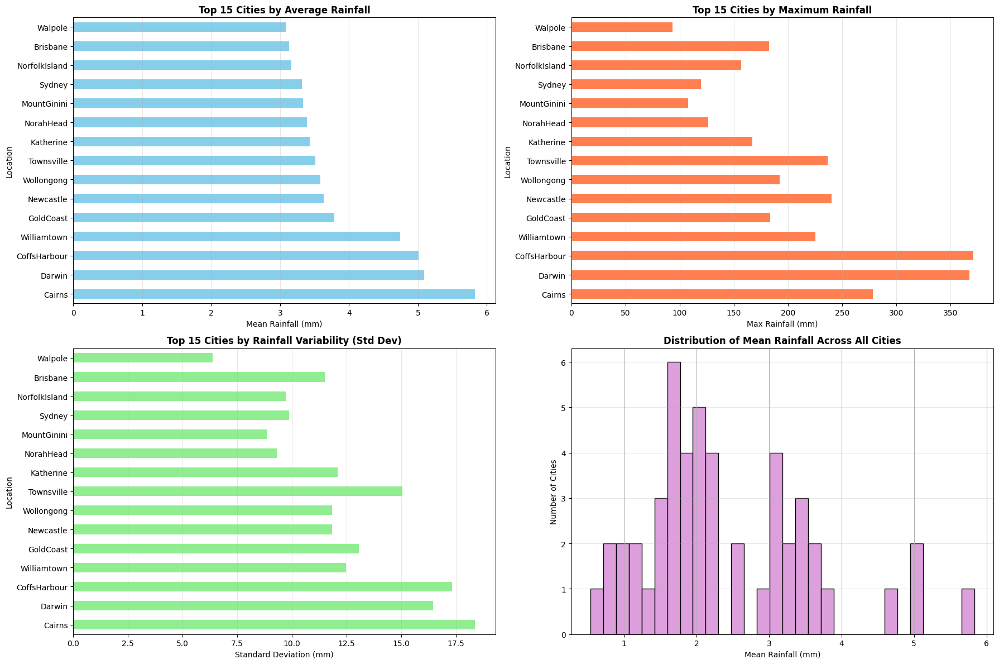

In [33]:
# 8. Statistical Summary: Rainfall statistics theo từng thành phố
print("=== RAINFALL STATISTICS BY CITY ===\n")

# Tạo summary statistics
rainfall_stats = data.groupby('Location')['Rainfall'].agg([
    ('Mean', 'mean'),
    ('Median', 'median'),
    ('Std Dev', 'std'),
    ('Min', 'min'),
    ('Max', 'max'),
    ('Count', 'count')
]).round(2).sort_values('Mean', ascending=False)

print(rainfall_stats.head(15))

# Visualize statistics
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Mean rainfall by city
ax1 = axes[0, 0]
top_mean = rainfall_stats['Mean'].head(15)
top_mean.plot(kind='barh', ax=ax1, color='skyblue')
ax1.set_title('Top 15 Cities by Average Rainfall', fontsize=12, fontweight='bold')
ax1.set_xlabel('Mean Rainfall (mm)')
ax1.grid(axis='x', alpha=0.3)

# Max rainfall by city
ax2 = axes[0, 1]
top_max = rainfall_stats['Max'].head(15)
top_max.plot(kind='barh', ax=ax2, color='coral')
ax2.set_title('Top 15 Cities by Maximum Rainfall', fontsize=12, fontweight='bold')
ax2.set_xlabel('Max Rainfall (mm)')
ax2.grid(axis='x', alpha=0.3)

# Std deviation by city
ax3 = axes[1, 0]
top_std = rainfall_stats['Std Dev'].head(15)
top_std.plot(kind='barh', ax=ax3, color='lightgreen')
ax3.set_title('Top 15 Cities by Rainfall Variability (Std Dev)', fontsize=12, fontweight='bold')
ax3.set_xlabel('Standard Deviation (mm)')
ax3.grid(axis='x', alpha=0.3)

# Distribution of mean rainfall across all cities
ax4 = axes[1, 1]
rainfall_stats['Mean'].hist(bins=30, ax=ax4, color='plum', edgecolor='black')
ax4.set_title('Distribution of Mean Rainfall Across All Cities', fontsize=12, fontweight='bold')
ax4.set_xlabel('Mean Rainfall (mm)')
ax4.set_ylabel('Number of Cities')
ax4.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

=== FEATURE IMPORTANCE ANALYSIS ===


Canberra - Top 3 Important Features:
    feature  importance
Pressure9am    0.170642
Humidity9am    0.158436
Humidity3pm    0.128173

Sydney - Top 3 Important Features:
      feature  importance
  Humidity9am    0.281129
 WindSpeed9am    0.113091
WindGustSpeed    0.112536

Adelaide - Top 3 Important Features:
    feature  importance
Humidity9am    0.207881
Pressure9am    0.182114
    Temp3pm    0.099193

Darwin - Top 3 Important Features:
    feature  importance
Humidity9am    0.357711
Pressure9am    0.173961
    MinTemp    0.104973

Hobart - Top 3 Important Features:
    feature  importance
Pressure9am    0.185661
Humidity9am    0.170685
Pressure3pm    0.089934

Perth - Top 3 Important Features:
    feature  importance
Pressure9am    0.244951
    Temp3pm    0.159958
Humidity9am    0.132315


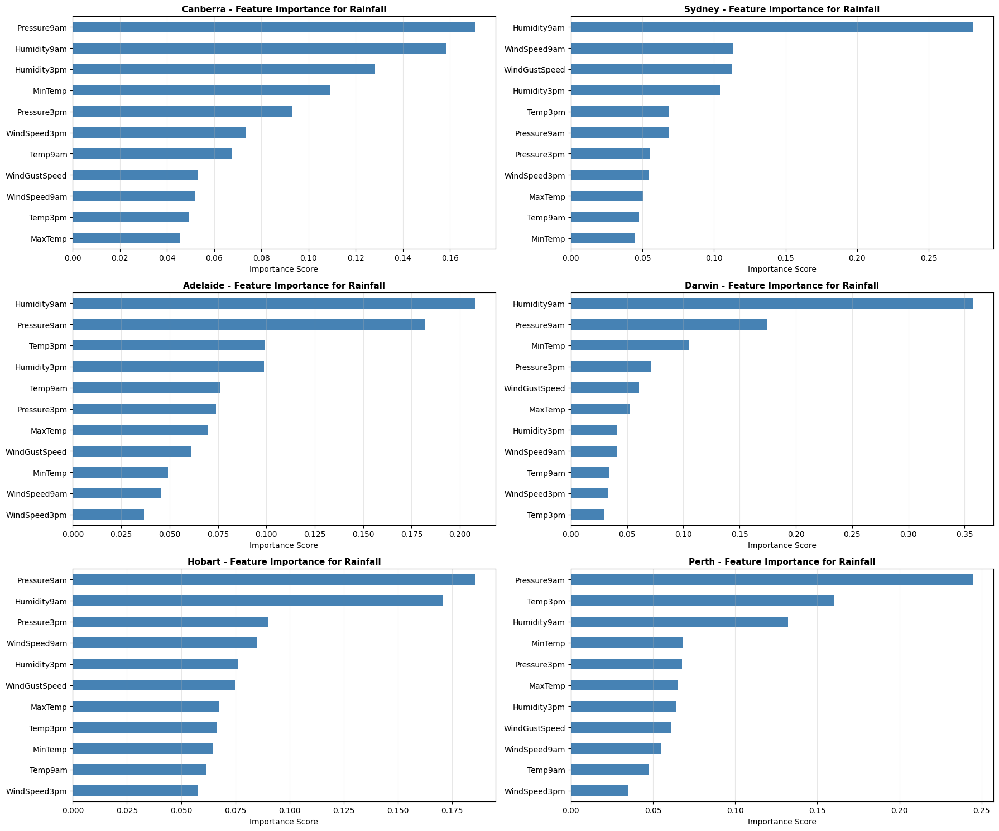

In [34]:
# 9. Feature Importance Analysis: Ảnh hưởng của features đến Rainfall theo thành phố
from sklearn.ensemble import RandomForestRegressor

print("=== FEATURE IMPORTANCE ANALYSIS ===\n")

# Chọn 6 thành phố để phân tích
selected_cities = data['Location'].value_counts().head(6).index

fig, axes = plt.subplots(3, 2, figsize=(18, 15))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Chuẩn bị dữ liệu
    feature_cols = ['MinTemp', 'MaxTemp', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 
                    'Temp9am', 'Temp3pm']
    
    X = city_data[feature_cols].fillna(city_data[feature_cols].mean())
    y = city_data['Rainfall']
    
    # Train Random Forest để tìm feature importance
    rf = RandomForestRegressor(n_estimators=100, random_state=42, max_depth=10)
    rf.fit(X, y)
    
    # Get feature importance
    importance = pd.DataFrame({
        'feature': feature_cols,
        'importance': rf.feature_importances_
    }).sort_values('importance', ascending=True)
    
    # Plot
    importance.plot(x='feature', y='importance', kind='barh', ax=ax, 
                   color='steelblue', legend=False)
    ax.set_title(f'{city} - Feature Importance for Rainfall', fontsize=11, fontweight='bold')
    ax.set_xlabel('Importance Score')
    ax.set_ylabel('')
    ax.grid(axis='x', alpha=0.3)
    
    print(f"\n{city} - Top 3 Important Features:")
    print(importance.sort_values('importance', ascending=False).head(3).to_string(index=False))

plt.tight_layout()
plt.show()

=== COMPARATIVE ANALYSIS ACROSS CITIES ===



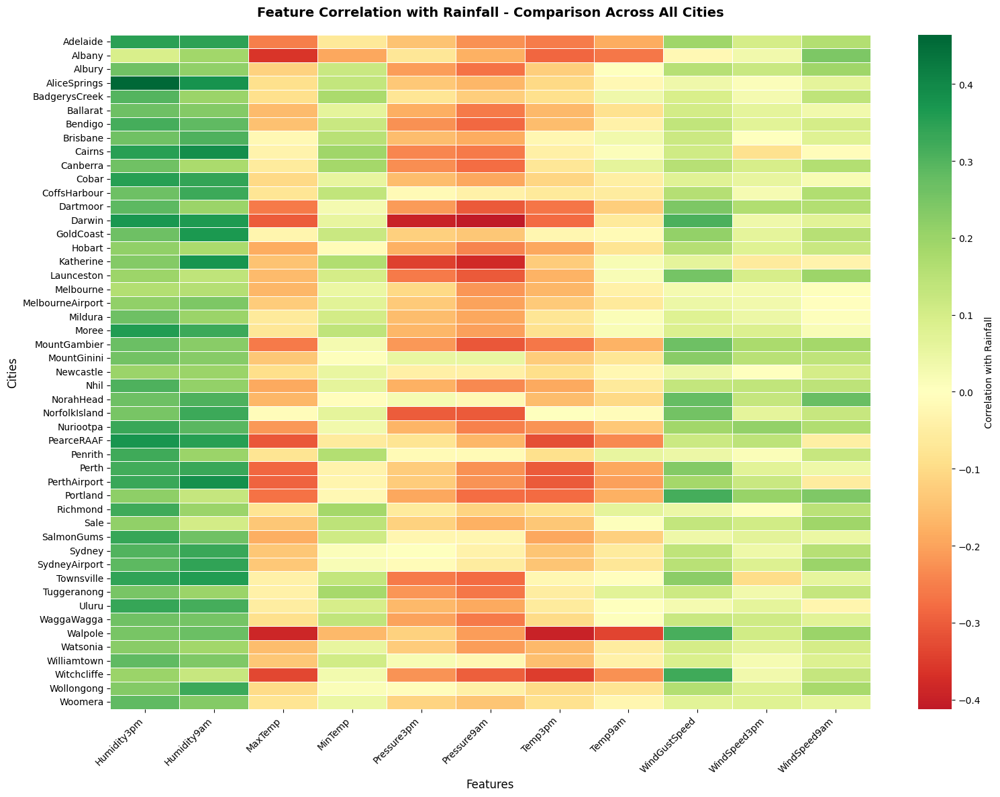


Average Correlation across all cities:
Feature
Humidity3pm      0.279021
Humidity9am      0.262167
WindGustSpeed    0.145305
WindSpeed9am     0.105903
WindSpeed3pm     0.067256
MinTemp          0.065861
Temp9am         -0.062699
Pressure3pm     -0.141108
MaxTemp         -0.151284
Temp3pm         -0.153958
Pressure9am     -0.191788
dtype: float64


In [35]:
# 10. Comparative Analysis: So sánh mối quan hệ features-Rainfall giữa các thành phố
print("=== COMPARATIVE ANALYSIS ACROSS CITIES ===\n")

# Tính correlation cho tất cả các thành phố
all_correlations = []

for city in data['Location'].unique():
    city_data = data[data['Location'] == city][available_features]
    corr = city_data.corr()['Rainfall'].drop('Rainfall')
    corr_df = pd.DataFrame({
        'City': city,
        'Feature': corr.index,
        'Correlation': corr.values
    })
    all_correlations.append(corr_df)

corr_comparison = pd.concat(all_correlations, ignore_index=True)

# Pivot để có matrix: thành phố x features
corr_pivot = corr_comparison.pivot(index='City', columns='Feature', values='Correlation')

# Heatmap so sánh
plt.figure(figsize=(16, 12))
sns.heatmap(corr_pivot, annot=False, cmap='RdYlGn', center=0, 
           cbar_kws={'label': 'Correlation with Rainfall'},
           linewidths=0.5)
plt.title('Feature Correlation with Rainfall - Comparison Across All Cities', 
         fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Features', fontsize=12)
plt.ylabel('Cities', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Top features có correlation cao nhất across cities
print("\nAverage Correlation across all cities:")
avg_corr = corr_pivot.mean().sort_values(ascending=False)
print(avg_corr)

## Phân tích Seasonal Patterns của Rainfall theo từng thành phố

In [36]:
# Chuyển đổi Date column sang datetime
data['Date'] = pd.to_datetime(data['Date'])

# Extract month, quarter, và season từ date
data['Month'] = data['Date'].dt.month
data['Quarter'] = data['Date'].dt.quarter
data['Year'] = data['Date'].dt.year

# Định nghĩa seasons cho Northern Hemisphere (Australia)
def get_season(month):
    if month in [12, 1, 2]:
        return 'Summer'
    elif month in [3, 4, 5]:
        return 'Autumn'
    elif month in [6, 7, 8]:
        return 'Winter'
    else:
        return 'Spring'

data['Season'] = data['Month'].apply(get_season)

print("Data prepared with temporal features")
print(f"Date range: {data['Date'].min()} to {data['Date'].max()}")

Data prepared with temporal features
Date range: 2007-11-01 00:00:00 to 2017-06-25 00:00:00


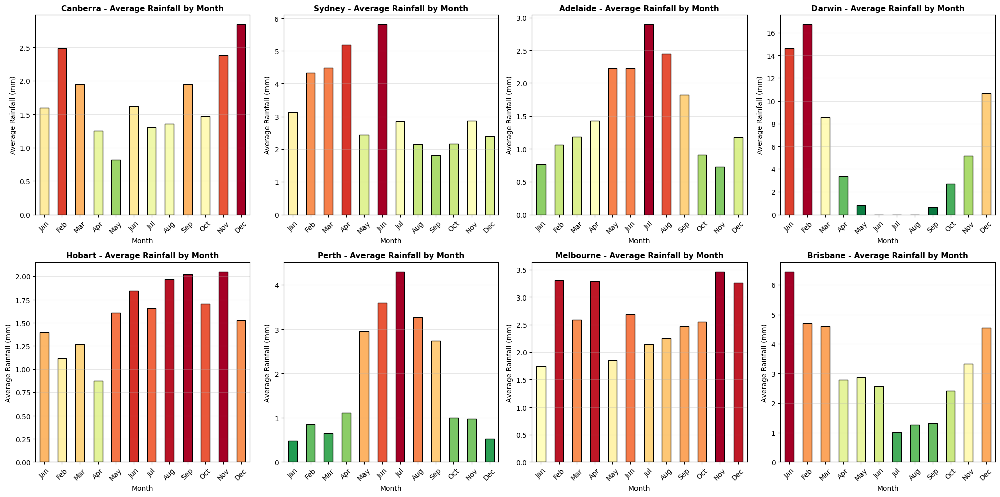

Monthly rainfall patterns visualization completed


In [37]:
# 1. Average Rainfall by Month - Biểu đồ cột theo từng thành phố
selected_cities = data['Location'].value_counts().head(8    ).index

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Tính average rainfall by month
    monthly_rainfall = city_data.groupby('Month')['Rainfall'].mean().sort_index()
    
    # Plot bar chart
    colors = plt.cm.RdYlGn_r(monthly_rainfall / monthly_rainfall.max())
    monthly_rainfall.plot(kind='bar', ax=ax, color=colors, edgecolor='black', linewidth=1)
    
    ax.set_title(f'{city} - Average Rainfall by Month', fontsize=11, fontweight='bold')
    ax.set_xlabel('Month')
    ax.set_ylabel('Average Rainfall (mm)')
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], 
                       rotation=45)
    ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("Monthly rainfall patterns visualization completed")

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15768\2804208785.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=city_data, x='Season', y='Rainfall', ax=ax,
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15768\2804208785.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=city_data, x='Season', y='Rainfall', ax=ax,
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15768\2804208785.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=city_data, x='Season', y='Rainfall', ax=ax,
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15768\28042087

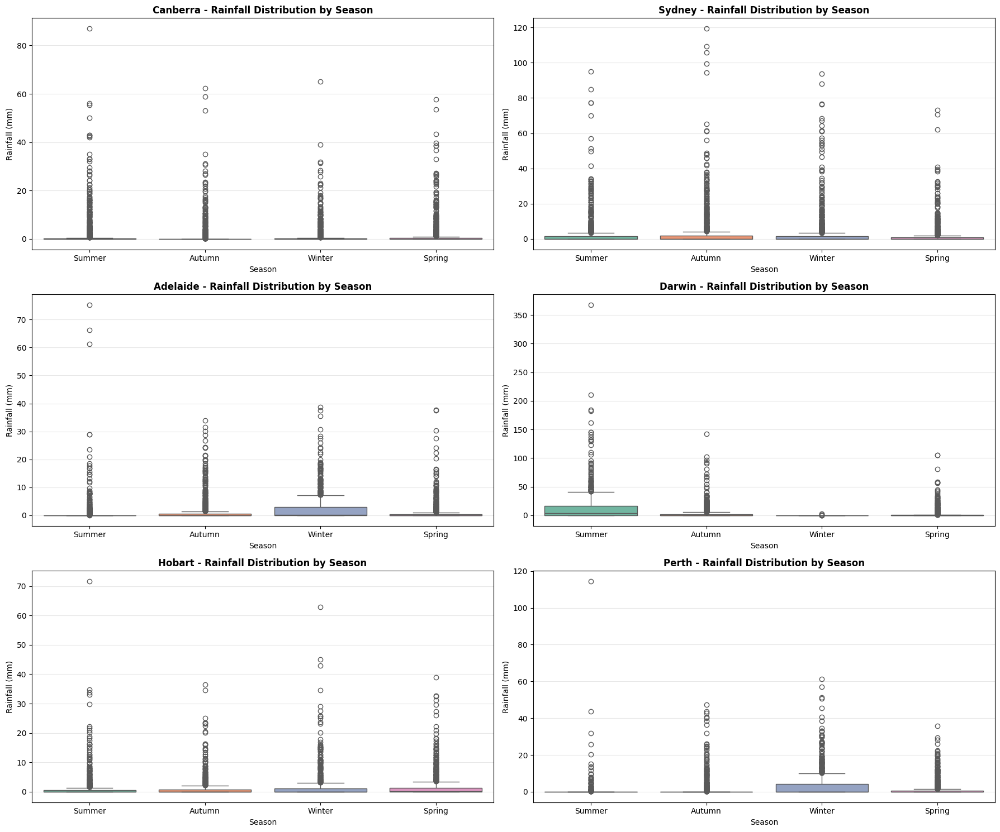

Seasonal rainfall distribution visualization completed


In [38]:
# 2. Seasonal Rainfall Distribution - Box plot theo từng thành phố
selected_cities = data['Location'].value_counts().head(6).index

fig, axes = plt.subplots(3, 2, figsize=(18, 15))
axes = axes.flatten()

seasons_order = ['Summer', 'Autumn', 'Winter', 'Spring']

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Box plot: Season vs Rainfall
    sns.boxplot(data=city_data, x='Season', y='Rainfall', ax=ax, 
               order=seasons_order, palette='Set2')
    
    ax.set_title(f'{city} - Rainfall Distribution by Season', fontsize=12, fontweight='bold')
    ax.set_xlabel('Season')
    ax.set_ylabel('Rainfall (mm)')
    ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("Seasonal rainfall distribution visualization completed")

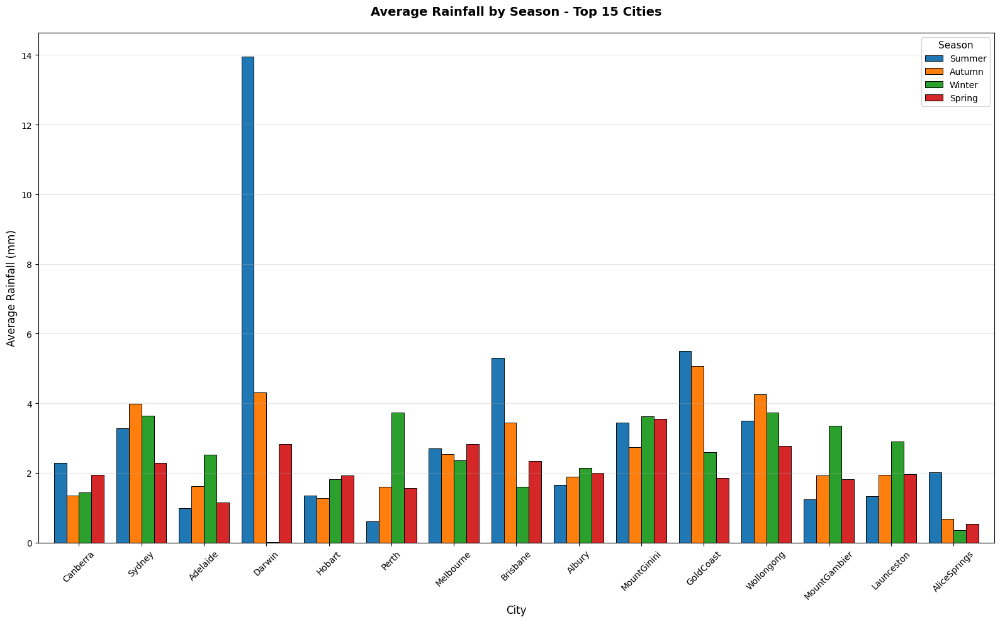

Seasonal comparison by city visualization completed


In [39]:
# 3. Average Rainfall by Season - Bar chart so sánh theo thành phố
seasons_order = ['Summer', 'Autumn', 'Winter', 'Spring']

# Tính average rainfall theo season cho tất cả thành phố
seasonal_avg = data.groupby(['Location', 'Season'])['Rainfall'].mean().unstack(fill_value=0)
seasonal_avg = seasonal_avg[seasons_order]

# Lấy top 15 thành phố
top_cities = data['Location'].value_counts().head(15).index
seasonal_avg_top = seasonal_avg.loc[top_cities]

# Plot
fig, ax = plt.subplots(figsize=(16, 10))
seasonal_avg_top.plot(kind='bar', ax=ax, width=0.8, edgecolor='black', linewidth=0.7)

ax.set_title('Average Rainfall by Season - Top 15 Cities', fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('City', fontsize=12)
ax.set_ylabel('Average Rainfall (mm)', fontsize=12)
ax.legend(title='Season', fontsize=10, title_fontsize=11)
ax.tick_params(axis='x', rotation=45)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("Seasonal comparison by city visualization completed")

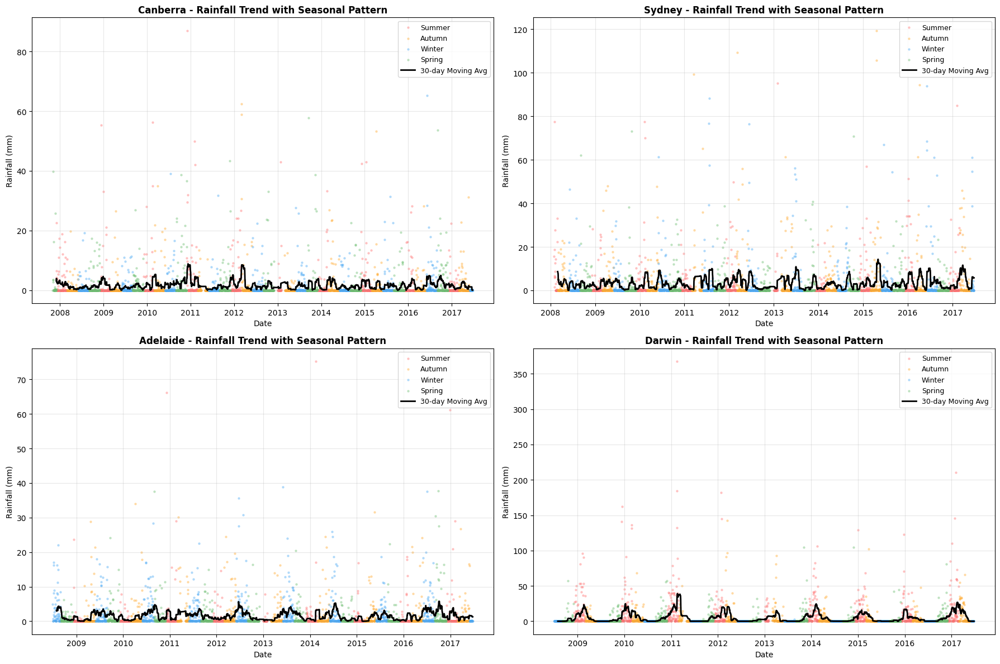

Rainfall trend with seasonal pattern visualization completed


In [40]:
# 4. Rainfall Trend over Years with Seasonal Color Coding
selected_cities = data['Location'].value_counts().head(4).index

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
axes = axes.flatten()

season_colors = {'Summer': '#FF6B6B', 'Autumn': '#FFA726', 'Winter': '#42A5F5', 'Spring': '#66BB6A'}

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city].sort_values('Date')
    
    # Plot rainfall trend with seasonal coloring
    for season in ['Summer', 'Autumn', 'Winter', 'Spring']:
        season_data = city_data[city_data['Season'] == season]
        ax.scatter(season_data['Date'], season_data['Rainfall'], 
                  alpha=0.3, s=5, color=season_colors[season], label=season)
    
    # Add rolling average
    city_data_sorted = city_data.set_index('Date').sort_index()
    rolling_avg = city_data_sorted['Rainfall'].rolling(window=30).mean()
    ax.plot(rolling_avg.index, rolling_avg.values, 'k-', linewidth=2, label='30-day Moving Avg')
    
    ax.set_title(f'{city} - Rainfall Trend with Seasonal Pattern', fontsize=12, fontweight='bold')
    ax.set_xlabel('Date')
    ax.set_ylabel('Rainfall (mm)')
    ax.legend(loc='upper right', fontsize=9)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("Rainfall trend with seasonal pattern visualization completed")

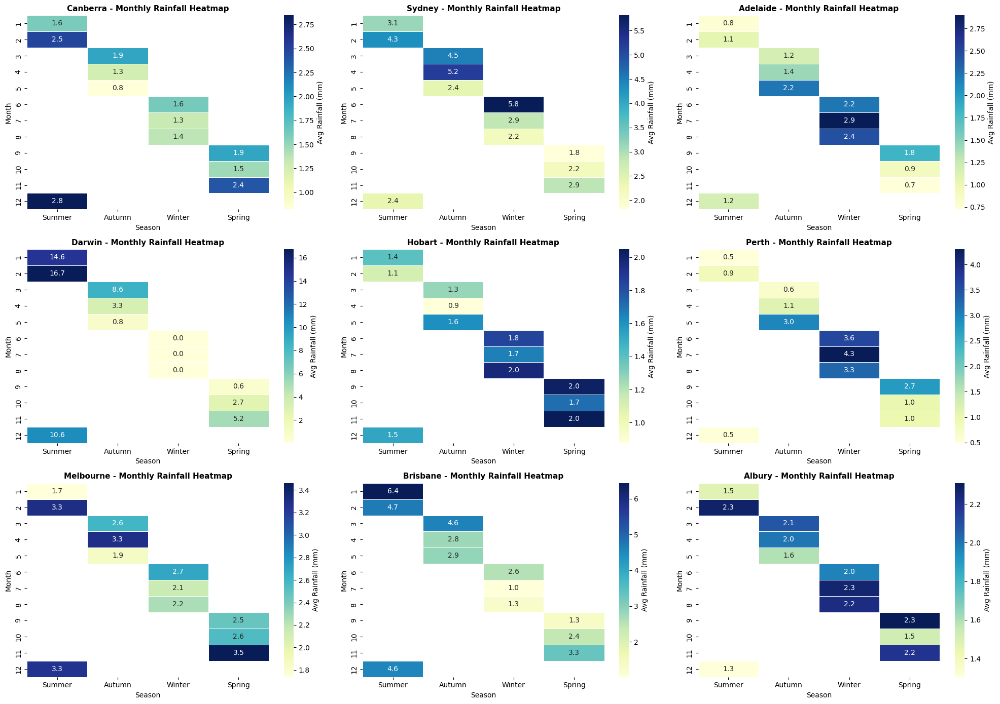

Monthly rainfall heatmap visualization completed


In [41]:
# 5. Heatmap: Average Rainfall by Month and Season
selected_cities = data['Location'].value_counts().head(9).index

fig, axes = plt.subplots(3, 3, figsize=(20, 14))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Pivot table: Month x Season
    pivot_table = city_data.pivot_table(values='Rainfall', 
                                        index='Month', 
                                        columns='Season', 
                                        aggfunc='mean')
    
    # Reorder columns theo season order
    pivot_table = pivot_table[['Summer', 'Autumn', 'Winter', 'Spring']]
    
    # Heatmap
    sns.heatmap(pivot_table, annot=True, fmt='.1f', cmap='YlGnBu', ax=ax,
               cbar_kws={'label': 'Avg Rainfall (mm)'}, linewidths=0.5)
    
    ax.set_title(f'{city} - Monthly Rainfall Heatmap', fontsize=11, fontweight='bold')
    ax.set_xlabel('Season')
    ax.set_ylabel('Month')

plt.tight_layout()
plt.show()

print("Monthly rainfall heatmap visualization completed")

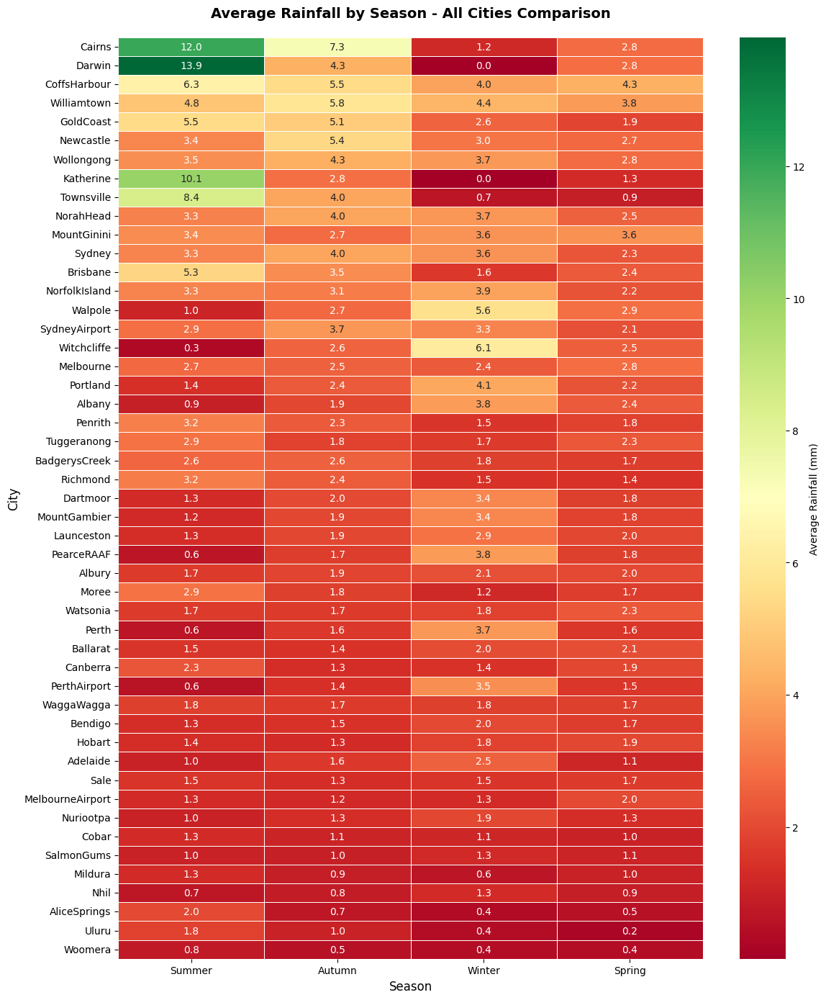

City-Season heatmap visualization completed


In [42]:
# 6. Seasonal Heatmap: City x Season
fig, ax = plt.subplots(figsize=(12, 14))

# Tính average rainfall theo city và season
seasonal_heatmap = data.groupby(['Location', 'Season'])['Rainfall'].mean().unstack(fill_value=0)
seasonal_heatmap = seasonal_heatmap[['Summer', 'Autumn', 'Winter', 'Spring']]

# Sắp xếp theo average rainfall
seasonal_heatmap['Average'] = seasonal_heatmap.mean(axis=1)
seasonal_heatmap = seasonal_heatmap.sort_values('Average', ascending=False).drop('Average', axis=1)

# Heatmap
sns.heatmap(seasonal_heatmap, annot=True, fmt='.1f', cmap='RdYlGn', ax=ax,
           cbar_kws={'label': 'Average Rainfall (mm)'}, linewidths=0.5)

ax.set_title('Average Rainfall by Season - All Cities Comparison', fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Season', fontsize=12)
ax.set_ylabel('City', fontsize=12)

plt.tight_layout()
plt.show()

print("City-Season heatmap visualization completed")

In [43]:
# 7. Seasonal Statistics Summary
print("=== SEASONAL RAINFALL STATISTICS ===\n")

# Tính statistics cho từng season
seasonal_stats = data.groupby('Season')['Rainfall'].agg([
    ('Mean', 'mean'),
    ('Median', 'median'),
    ('Std Dev', 'std'),
    ('Min', 'min'),
    ('Max', 'max'),
    ('Count', 'count')
]).round(2)

# Reorder by season order
seasonal_stats = seasonal_stats.reindex(['Summer', 'Autumn', 'Winter', 'Spring'])
print("Overall Seasonal Statistics:")
print(seasonal_stats)

print("\n" + "="*60 + "\n")

# Tính theo từng thành phố - top 10 cities
top_cities = data['Location'].value_counts().head(10).index
print("Seasonal Statistics by City (Top 10 Cities):\n")

for city in top_cities:
    city_seasonal = data[data['Location'] == city].groupby('Season')['Rainfall'].agg(['mean', 'median', 'std']).round(2)
    city_seasonal = city_seasonal.reindex(['Summer', 'Autumn', 'Winter', 'Spring'])
    print(f"\n{city}:")
    print(city_seasonal)

=== SEASONAL RAINFALL STATISTICS ===

Overall Seasonal Statistics:
        Mean  Median  Std Dev  Min    Max  Count
Season                                          
Summer  2.86     0.0    10.93  0.0  367.6  35122
Autumn  2.50     0.0     8.88  0.0  240.0  38264
Winter  2.40     0.0     6.98  0.0  219.6  36737
Spring  1.99     0.0     6.73  0.0  371.0  35337


Seasonal Statistics by City (Top 10 Cities):


Canberra:
        mean  median   std
Season                    
Summer  2.28     0.0  7.05
Autumn  1.35     0.0  5.11
Winter  1.43     0.0  4.55
Spring  1.94     0.0  5.85

Sydney:
        mean  median    std
Season                     
Summer  3.28     0.0   9.43
Autumn  3.99     0.0  11.47
Winter  3.65     0.0  10.84
Spring  2.28     0.0   6.84

Adelaide:
        mean  median   std
Season                    
Summer  0.99     0.0  5.09
Autumn  1.62     0.0  4.37
Winter  2.53     0.2  4.90
Spring  1.15     0.0  3.55

Darwin:
         mean  median    std
Season                      
S

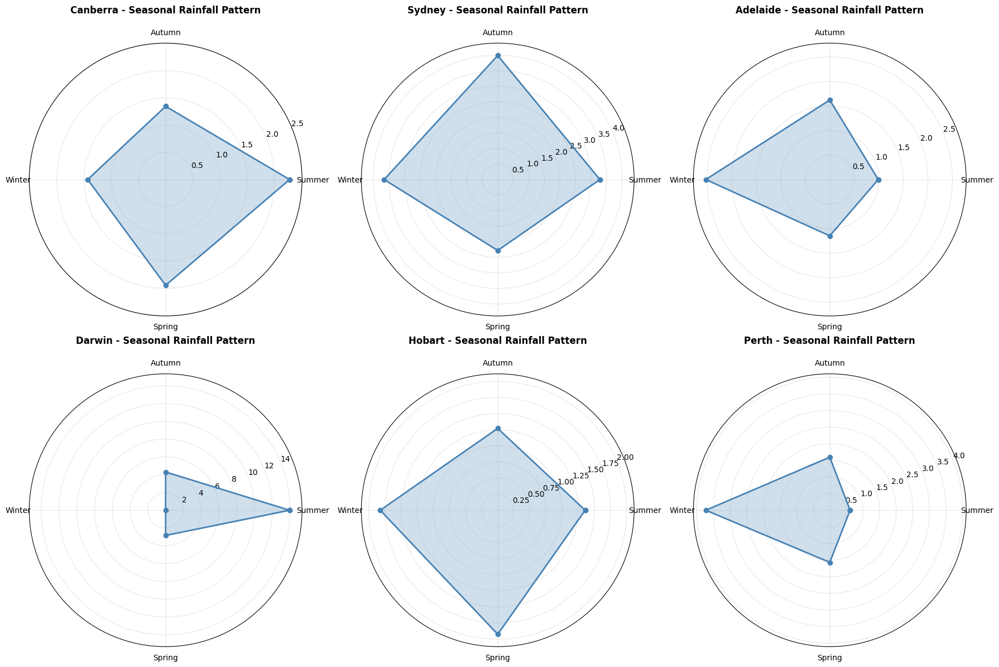

Polar/Radar chart for seasonal patterns completed


In [44]:
# 8. Polar Plot: Seasonal Rainfall Pattern (Radar Chart)
from math import pi

selected_cities = data['Location'].value_counts().head(6).index

fig, axes = plt.subplots(2, 3, figsize=(18, 12), subplot_kw=dict(projection='polar'))
axes = axes.flatten()

seasons = ['Summer', 'Autumn', 'Winter', 'Spring']
colors_list = ['#FF6B6B', '#FFA726', '#42A5F5', '#66BB6A']

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Tính average rainfall cho mỗi season
    values = [city_data[city_data['Season'] == season]['Rainfall'].mean() for season in seasons]
    values += values[:1]  # Duplicate first value for closing circle
    
    # Angles
    angles = [n / float(len(seasons)) * 2 * pi for n in range(len(seasons))]
    angles += angles[:1]
    
    # Plot
    ax.plot(angles, values, 'o-', linewidth=2, color='steelblue')
    ax.fill(angles, values, alpha=0.25, color='steelblue')
    
    # Set labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(seasons)
    ax.set_ylim(0, max(values) * 1.1)
    
    ax.set_title(f'{city} - Seasonal Rainfall Pattern', fontsize=12, fontweight='bold', pad=20)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("Polar/Radar chart for seasonal patterns completed")

=== SEASONAL CONSISTENCY ANALYSIS ===

Seasonal Consistency Scores (Coefficient of Variation - lower is more consistent):
        City  Summer_CV  Autumn_CV  Winter_CV  Spring_CV  Overall_CV
      Sydney  31.033652  28.222628  38.340852  44.693181   35.572578
      Hobart  28.410985  45.082512  43.422239  52.531555   42.361823
    Adelaide  44.078379  38.770787  39.101945  66.510679   47.115447
  Launceston  43.109428  36.233140  50.427384  66.347623   49.029394
  Wollongong  44.478106  42.408118  51.789687  68.040818   51.679182
    Canberra  38.640262  61.165731  62.277966  49.646408   52.932592
    Brisbane  46.067242  52.456452  49.912985  72.217735   55.163603
MountGambier  74.109006  39.059189  52.028003  66.880963   58.019290
 MountGinini  52.600128  52.469397  58.065178  71.913207   58.761977
      Albury  59.164585  55.581517  53.697104  71.431953   59.968790
       Perth 130.679962  49.220851  17.035367  45.050151   60.496583
   GoldCoast  53.989806  44.832358  51.874742 101.

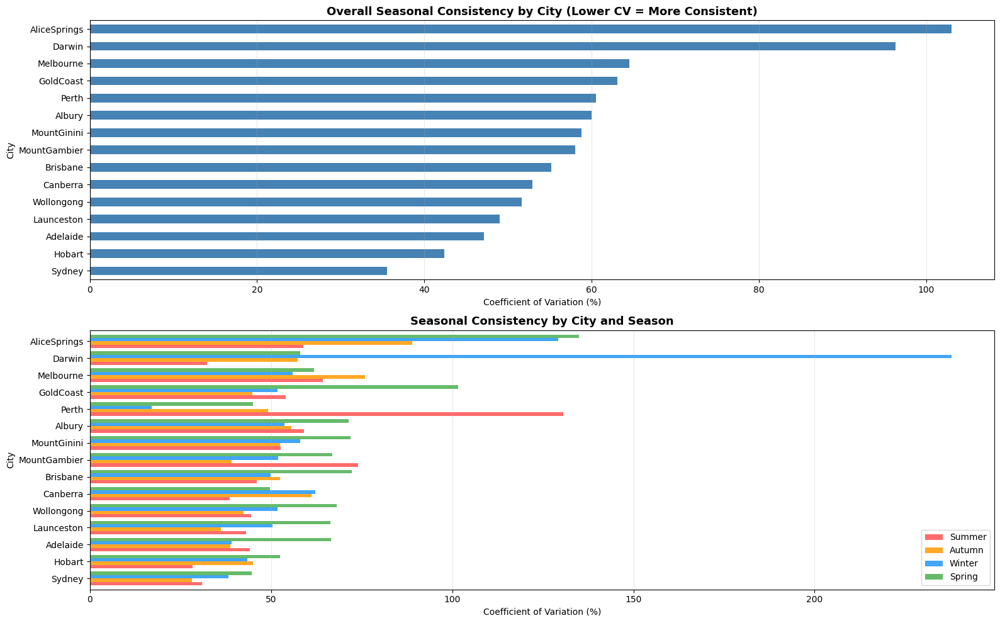


Consistency analysis completed


In [45]:
# 12. Seasonal Consistency Score: Đánh giá độ ổn định của pattern qua các năm
print("=== SEASONAL CONSISTENCY ANALYSIS ===\n")

selected_cities = data['Location'].value_counts().head(15).index

consistency_data = []

for city in selected_cities:
    city_data = data[data['Location'] == city]
    
    # Tính yearly average cho mỗi season
    yearly_seasonal = city_data.groupby(['Year', 'Season'])['Rainfall'].mean().unstack(fill_value=0)
    yearly_seasonal = yearly_seasonal[seasons_order]
    
    # Tính Coefficient of Variation cho mỗi season (lower = more consistent)
    cv_scores = {}
    for season in seasons_order:
        values = yearly_seasonal[season].values
        cv = (values.std() / values.mean() * 100) if values.mean() > 0 else 0
        cv_scores[season] = cv
    
    # Overall consistency score (average CV)
    overall_cv = sum(cv_scores.values()) / len(cv_scores)
    
    consistency_data.append({
        'City': city,
        'Summer_CV': cv_scores['Summer'],
        'Autumn_CV': cv_scores['Autumn'],
        'Winter_CV': cv_scores['Winter'],
        'Spring_CV': cv_scores['Spring'],
        'Overall_CV': overall_cv
    })

# Create DataFrame
consistency_df = pd.DataFrame(consistency_data).sort_values('Overall_CV')

print("Seasonal Consistency Scores (Coefficient of Variation - lower is more consistent):")
print(consistency_df.to_string(index=False))

# Visualize
fig, axes = plt.subplots(2, 1, figsize=(16, 10))

# Overall consistency
ax1 = axes[0]
consistency_df.plot(x='City', y='Overall_CV', kind='barh', ax=ax1, 
                   color='steelblue', legend=False)
ax1.set_title('Overall Seasonal Consistency by City (Lower CV = More Consistent)', 
             fontsize=13, fontweight='bold')
ax1.set_xlabel('Coefficient of Variation (%)')
ax1.set_ylabel('City')
ax1.grid(axis='x', alpha=0.3)

# By season
ax2 = axes[1]
consistency_df.set_index('City')[['Summer_CV', 'Autumn_CV', 'Winter_CV', 'Spring_CV']].plot(
    kind='barh', ax=ax2, 
    color=[season_colors[s] for s in seasons_order],
    width=0.8
)
ax2.set_title('Seasonal Consistency by City and Season', fontsize=13, fontweight='bold')
ax2.set_xlabel('Coefficient of Variation (%)')
ax2.set_ylabel('City')
ax2.legend(['Summer', 'Autumn', 'Winter', 'Spring'], loc='best')
ax2.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print("\nConsistency analysis completed")

=== SEASONAL ANOMALY DETECTION ===


Canberra - Unusual Seasonal Patterns:
  Summer - Low anomalies:
    2017: 0.49 mm (mean=2.28, -2.03σ)
  Winter - High anomalies:
    2016: 2.84 mm (mean=1.21, +2.15σ)
  Spring - Low anomalies:
    2017: 0.00 mm (mean=1.84, -2.01σ)

Sydney - Unusual Seasonal Patterns:
  Winter - High anomalies:
    2017: 6.92 mm (mean=3.89, +2.03σ)
  Spring - Low anomalies:
    2017: 0.00 mm (mean=2.05, -2.24σ)

Adelaide - Unusual Seasonal Patterns:
  Autumn - Low anomalies:
    2008: 0.00 mm (mean=1.48, -2.58σ)
  Winter - Low anomalies:
    2017: 0.08 mm (mean=2.38, -2.47σ)
  Spring - High anomalies:
    2016: 2.70 mm (mean=1.03, +2.42σ)

Darwin - Unusual Seasonal Patterns:
  Winter - High anomalies:
    2013: 0.03 mm (mean=0.00, +2.94σ)

Hobart - Unusual Seasonal Patterns:
  Autumn - Low anomalies:
    2008: 0.00 mm (mean=1.14, -2.22σ)
  Winter - Low anomalies:
    2017: 0.20 mm (mean=1.69, -2.03σ)

Perth - Unusual Seasonal Patterns:
  Summer - High anomalies:
    

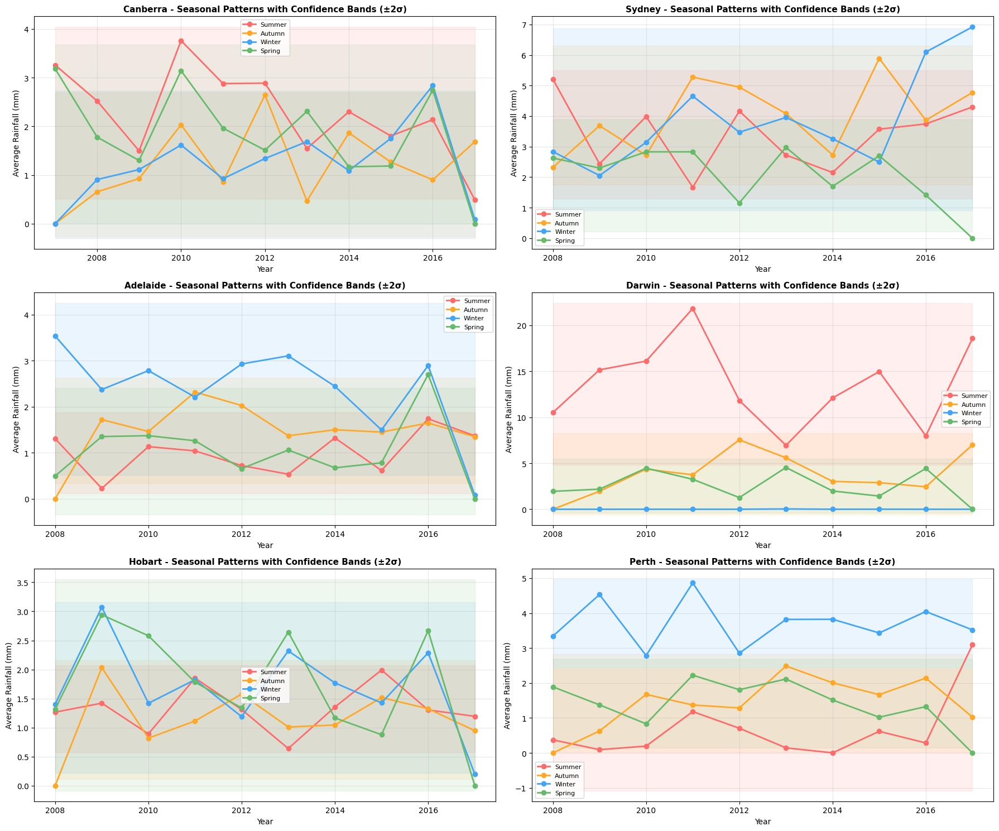



Anomaly detection completed


In [46]:
# 11. Anomaly Detection: Identify unusual seasonal patterns
from scipy import stats as scipy_stats

print("=== SEASONAL ANOMALY DETECTION ===\n")

selected_cities = data['Location'].value_counts().head(6).index

fig, axes = plt.subplots(3, 2, figsize=(18, 15))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    print(f"\n{city} - Unusual Seasonal Patterns:")
    
    # Tính yearly average cho mỗi season
    yearly_seasonal = city_data.groupby(['Year', 'Season'])['Rainfall'].mean().unstack(fill_value=0)
    yearly_seasonal = yearly_seasonal[seasons_order]
    
    for season in seasons_order:
        values = yearly_seasonal[season].values
        mean = values.mean()
        std = values.std()
        
        # Identify anomalies (values beyond 2 std deviations)
        anomalies = yearly_seasonal[yearly_seasonal[season] > mean + 2*std]
        if len(anomalies) > 0:
            print(f"  {season} - High anomalies:")
            for year in anomalies.index:
                print(f"    {year}: {anomalies.loc[year, season]:.2f} mm (mean={mean:.2f}, +{(anomalies.loc[year, season]-mean)/std:.2f}σ)")
        
        anomalies_low = yearly_seasonal[yearly_seasonal[season] < mean - 2*std]
        if len(anomalies_low) > 0:
            print(f"  {season} - Low anomalies:")
            for year in anomalies_low.index:
                print(f"    {year}: {anomalies_low.loc[year, season]:.2f} mm (mean={mean:.2f}, {(anomalies_low.loc[year, season]-mean)/std:.2f}σ)")
        
        # Plot with confidence bands
        ax.plot(yearly_seasonal.index, yearly_seasonal[season], 
               marker='o', linewidth=2, label=season, color=season_colors[season])
        
        # Add confidence band (±2 std)
        ax.fill_between(yearly_seasonal.index, 
                       mean - 2*std, mean + 2*std, 
                       alpha=0.1, color=season_colors[season])
    
    ax.set_title(f'{city} - Seasonal Patterns with Confidence Bands (±2σ)', 
                fontsize=11, fontweight='bold')
    ax.set_xlabel('Year', fontsize=10)
    ax.set_ylabel('Average Rainfall (mm)', fontsize=10)
    ax.legend(loc='best', fontsize=8)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n\nAnomaly detection completed")

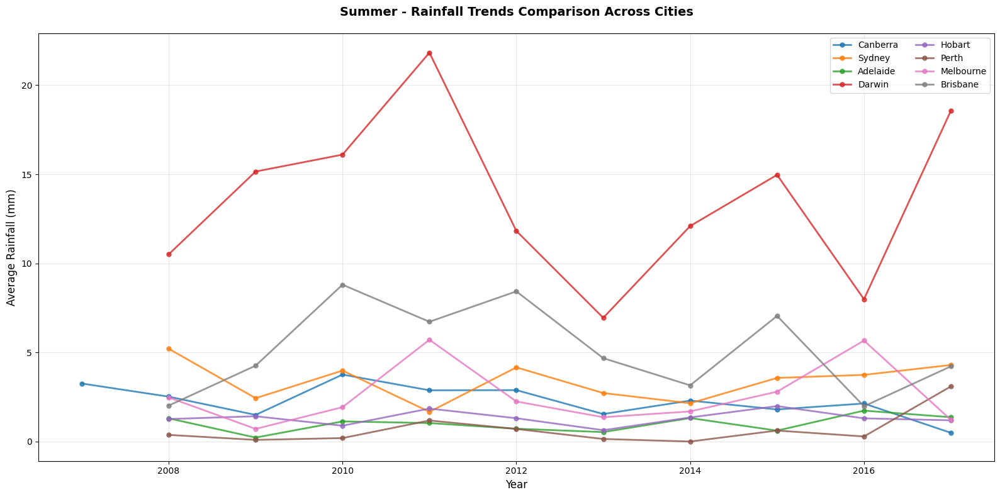

Summer comparison completed


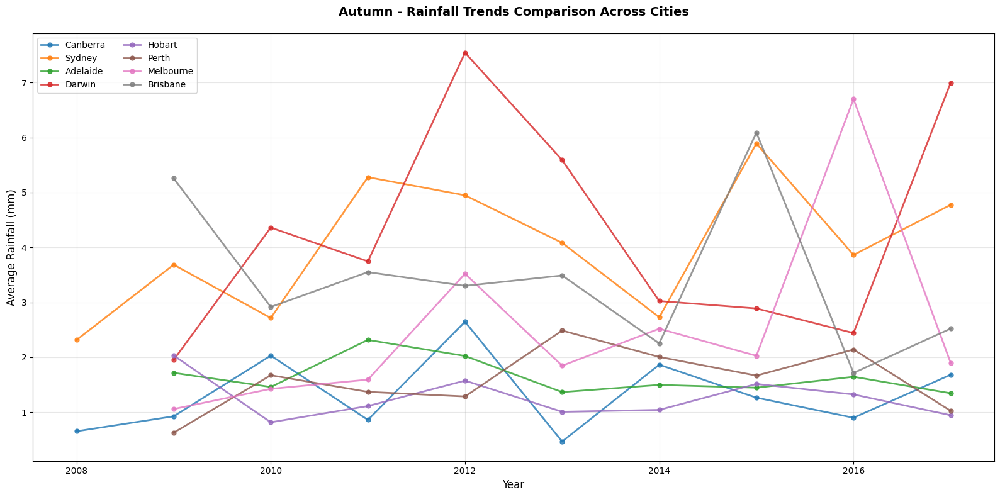

Autumn comparison completed


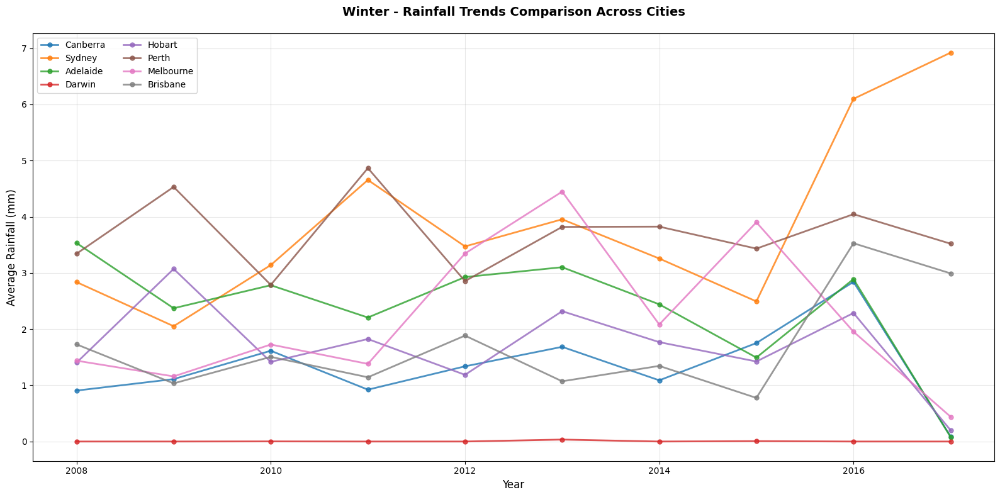

Winter comparison completed


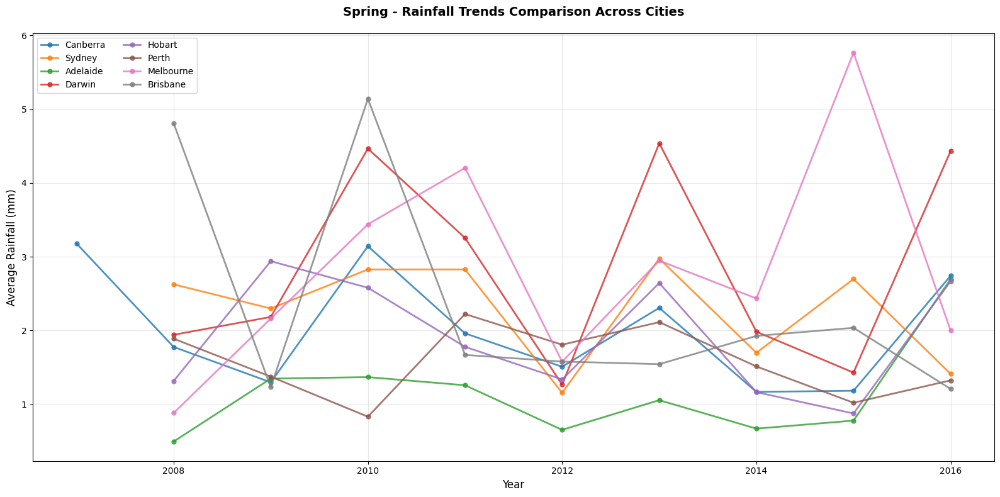

Spring comparison completed

All seasonal comparisons across cities completed


In [47]:
# 10. Comparative Analysis: So sánh Seasonal Patterns giữa các thành phố qua time
# Chọn 8 thành phố để compare
selected_cities = data['Location'].value_counts().head(8).index

for season in seasons_order:
    fig, ax = plt.subplots(figsize=(16, 8))
    
    for city in selected_cities:
        city_data = data[data['Location'] == city]
        yearly_data = city_data[city_data['Season'] == season].groupby('Year')['Rainfall'].mean()
        
        ax.plot(yearly_data.index, yearly_data.values, 
               marker='o', linewidth=2, label=city, markersize=5, alpha=0.8)
    
    ax.set_title(f'{season} - Rainfall Trends Comparison Across Cities', 
                fontsize=14, fontweight='bold', pad=20)
    ax.set_xlabel('Year', fontsize=12)
    ax.set_ylabel('Average Rainfall (mm)', fontsize=12)
    ax.legend(loc='best', fontsize=10, ncol=2)
    ax.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    print(f"{season} comparison completed")

print("\nAll seasonal comparisons across cities completed")

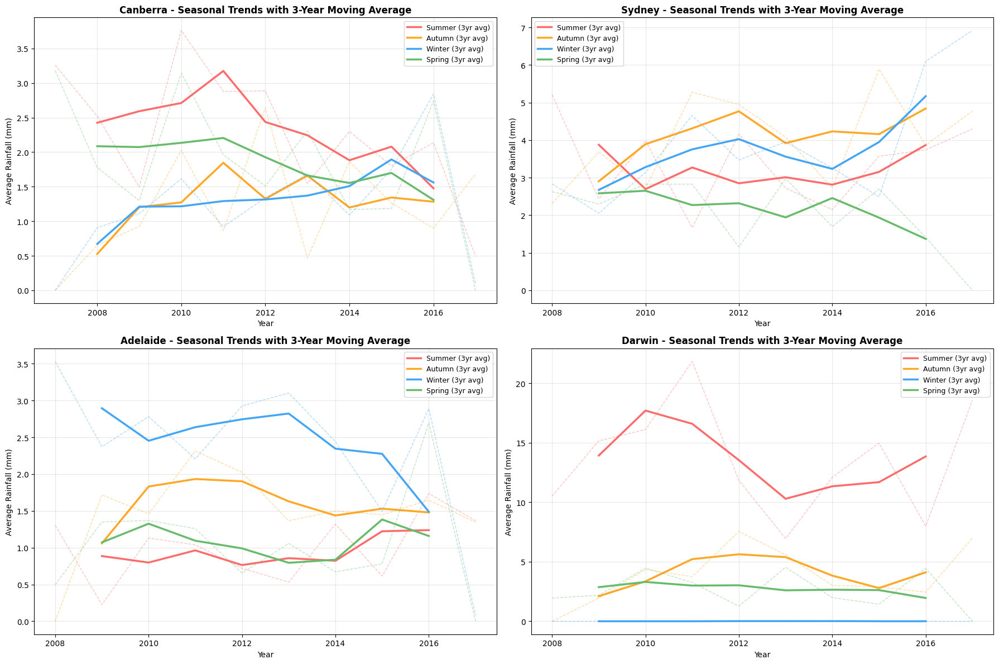

Moving average analysis completed


In [48]:
# 9. Moving Average Analysis: 3-Year Rolling Average cho từng Season
selected_cities = data['Location'].value_counts().head(4).index

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Tính yearly average
    yearly_seasonal = city_data.groupby(['Year', 'Season'])['Rainfall'].mean().unstack(fill_value=0)
    yearly_seasonal = yearly_seasonal[seasons_order]
    
    # Plot original và rolling average
    for season in seasons_order:
        # Original line (dashed, lighter)
        ax.plot(yearly_seasonal.index, yearly_seasonal[season], 
               '--', linewidth=1, alpha=0.4, color=season_colors[season])
        
        # 3-year rolling average (solid, darker)
        rolling_avg = yearly_seasonal[season].rolling(window=3, center=True).mean()
        ax.plot(rolling_avg.index, rolling_avg.values, 
               '-', linewidth=2.5, label=f'{season} (3yr avg)', 
               color=season_colors[season])
    
    ax.set_title(f'{city} - Seasonal Trends with 3-Year Moving Average', 
                fontsize=12, fontweight='bold')
    ax.set_xlabel('Year', fontsize=10)
    ax.set_ylabel('Average Rainfall (mm)', fontsize=10)
    ax.legend(loc='best', fontsize=9)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("Moving average analysis completed")

In [49]:
# 8. Statistical Summary: Seasonal Variability Across Years
print("=== SEASONAL VARIABILITY ANALYSIS ===\n")

selected_cities = data['Location'].value_counts().head(10).index

for city in selected_cities:
    city_data = data[data['Location'] == city]
    
    print(f"\n{'='*60}")
    print(f"{city}")
    print('='*60)
    
    # Tính statistics cho mỗi season qua các năm
    for season in seasons_order:
        season_data = city_data[city_data['Season'] == season]
        yearly_avg = season_data.groupby('Year')['Rainfall'].mean()
        
        print(f"\n{season}:")
        print(f"  Overall Mean: {yearly_avg.mean():.2f} mm")
        print(f"  Std Dev across years: {yearly_avg.std():.2f} mm")
        print(f"  Min year avg: {yearly_avg.min():.2f} mm ({yearly_avg.idxmin()})")
        print(f"  Max year avg: {yearly_avg.max():.2f} mm ({yearly_avg.idxmax()})")
        print(f"  Range: {yearly_avg.max() - yearly_avg.min():.2f} mm")
        print(f"  Coefficient of Variation: {(yearly_avg.std()/yearly_avg.mean()*100):.2f}%")

print("\n\nStatistical summary completed")

=== SEASONAL VARIABILITY ANALYSIS ===


Canberra

Summer:
  Overall Mean: 2.28 mm
  Std Dev across years: 0.92 mm
  Min year avg: 0.49 mm (2017)
  Max year avg: 3.76 mm (2010)
  Range: 3.27 mm
  Coefficient of Variation: 40.53%

Autumn:
  Overall Mean: 1.33 mm
  Std Dev across years: 0.70 mm
  Min year avg: 0.47 mm (2013)
  Max year avg: 2.65 mm (2012)
  Range: 2.18 mm
  Coefficient of Variation: 52.62%

Winter:
  Overall Mean: 1.33 mm
  Std Dev across years: 0.72 mm
  Min year avg: 0.09 mm (2017)
  Max year avg: 2.84 mm (2016)
  Range: 2.75 mm
  Coefficient of Variation: 53.92%

Spring:
  Overall Mean: 2.03 mm
  Std Dev across years: 0.78 mm
  Min year avg: 1.17 mm (2014)
  Max year avg: 3.18 mm (2007)
  Range: 2.01 mm
  Coefficient of Variation: 38.47%

Sydney

Summer:
  Overall Mean: 3.39 mm
  Std Dev across years: 1.11 mm
  Min year avg: 1.67 mm (2011)
  Max year avg: 5.21 mm (2008)
  Range: 3.54 mm
  Coefficient of Variation: 32.71%

Autumn:
  Overall Mean: 4.03 mm
  Std Dev acros

c:\Users\ADMIN\OneDrive\Documents\_Project\AIL303m\.venv\Lib\site-packages\matplotlib\colors.py:2295: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)
c:\Users\ADMIN\OneDrive\Documents\_Project\AIL303m\.venv\Lib\site-packages\matplotlib\colors.py:2295: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)
c:\Users\ADMIN\OneDrive\Documents\_Project\AIL303m\.venv\Lib\site-packages\matplotlib\colors.py:2295: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)
c:\Users\ADMIN\OneDrive\Documents\_Project\AIL303m\.venv\Lib\site-packages\matplotlib\colors.py:2295: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)
c:\Users\ADMIN\OneDrive\Documents\_Project\AIL303m\.venv\Lib\site-packages\matplotlib\colors.py:2295: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)


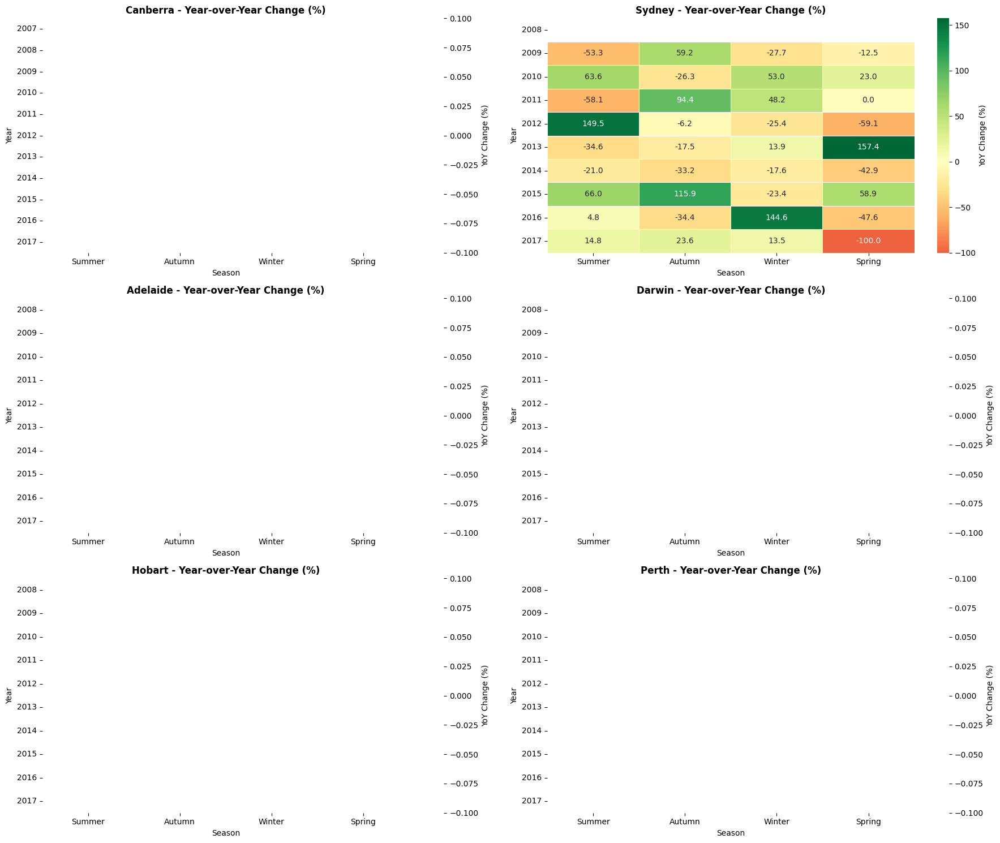

Year-over-Year change analysis completed


In [50]:
# 7. Year-over-Year Change Analysis
selected_cities = data['Location'].value_counts().head(6).index

fig, axes = plt.subplots(3, 2, figsize=(18, 15))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Tính yearly average cho mỗi season
    yearly_seasonal = city_data.groupby(['Year', 'Season'])['Rainfall'].mean().unstack(fill_value=0)
    yearly_seasonal = yearly_seasonal[seasons_order]
    
    # Tính year-over-year percentage change
    yoy_change = yearly_seasonal.pct_change() * 100
    
    # Plot heatmap của YoY change
    sns.heatmap(yoy_change, annot=True, fmt='.1f', cmap='RdYlGn', 
               center=0, ax=ax, cbar_kws={'label': 'YoY Change (%)'},
               linewidths=0.5)
    
    ax.set_title(f'{city} - Year-over-Year Change (%)', 
                fontsize=12, fontweight='bold')
    ax.set_xlabel('Season', fontsize=10)
    ax.set_ylabel('Year', fontsize=10)

plt.tight_layout()
plt.show()

print("Year-over-Year change analysis completed")

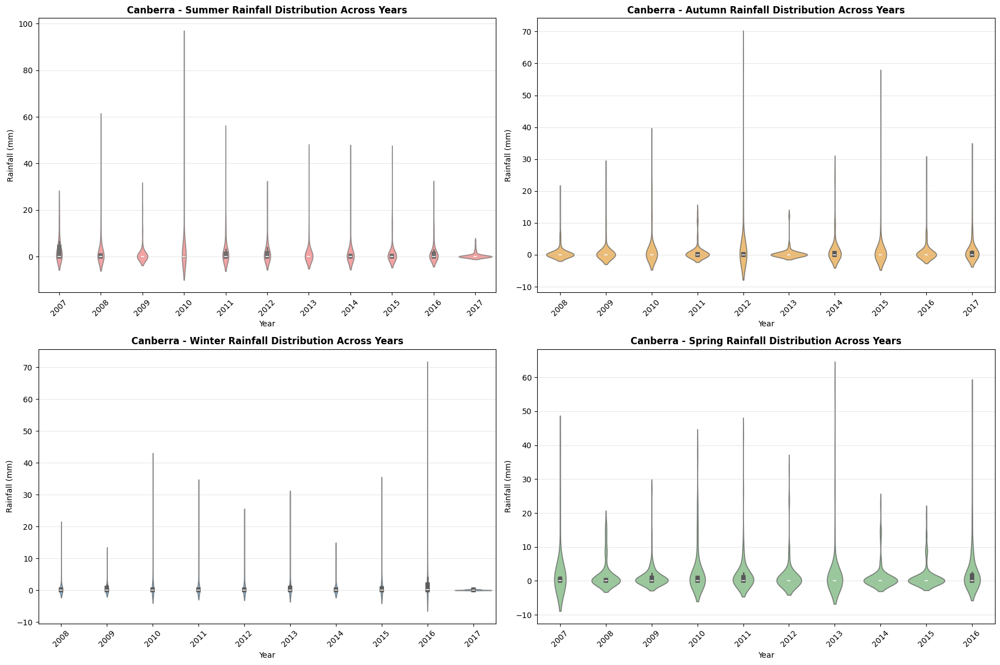

Violin plot for Canberra completed


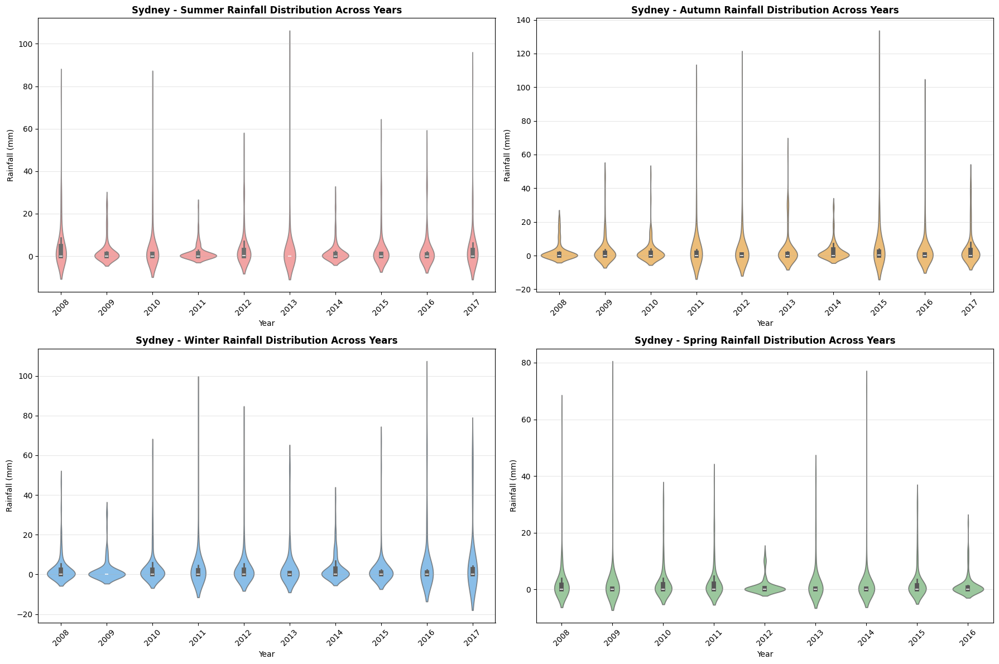

Violin plot for Sydney completed


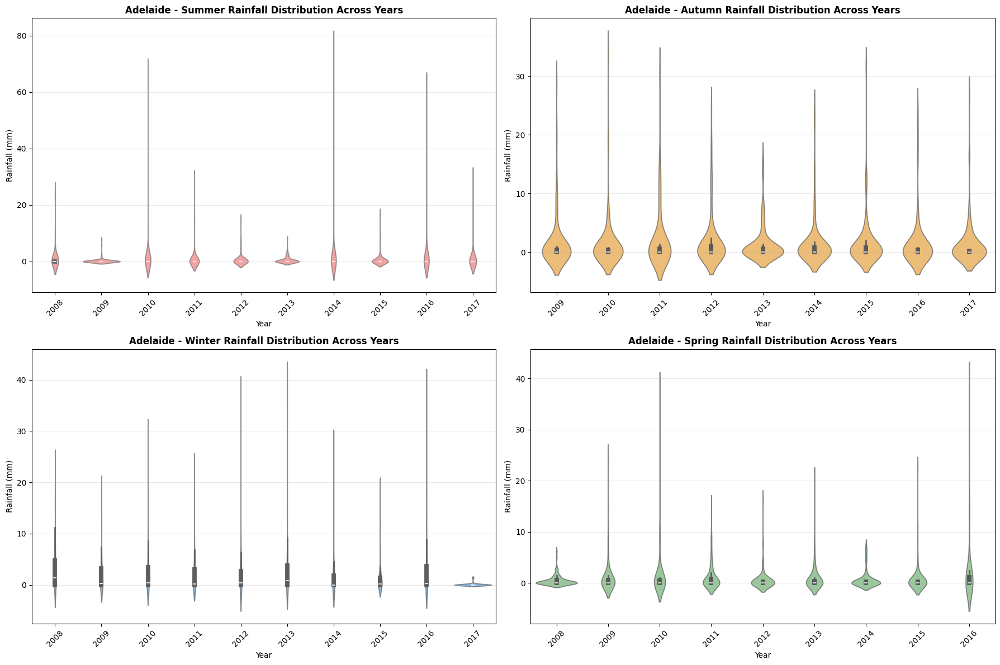

Violin plot for Adelaide completed


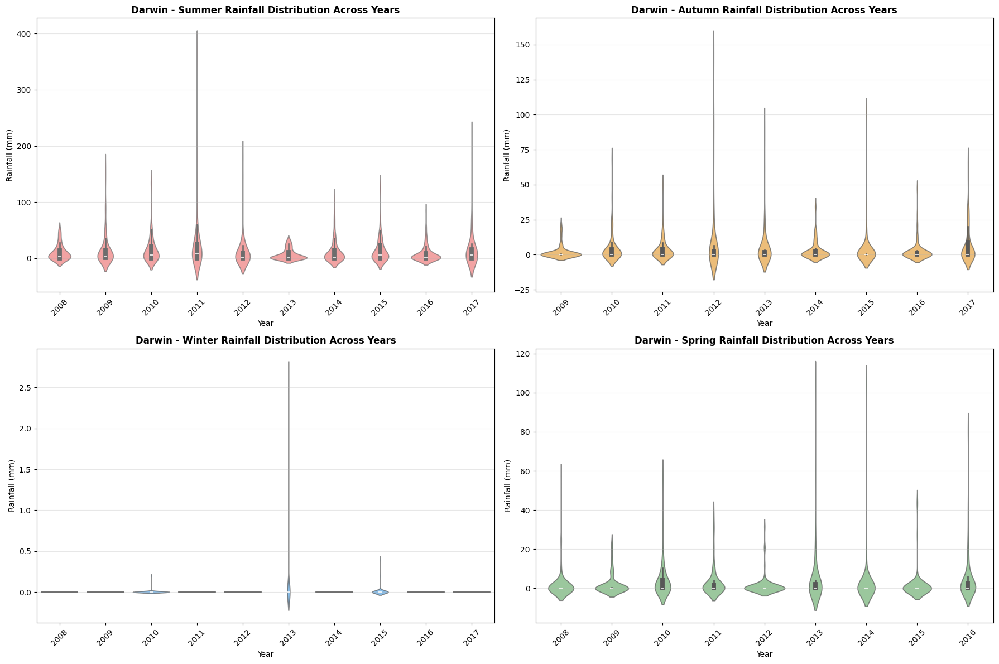

Violin plot for Darwin completed

All violin plots completed


In [51]:
# 6. Violin Plot: Detailed Distribution qua các năm theo Season
selected_cities = data['Location'].value_counts().head(4).index

for city in selected_cities:
    city_data = data[data['Location'] == city]
    
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    axes = axes.flatten()
    
    for idx, season in enumerate(seasons_order):
        ax = axes[idx]
        season_data = city_data[city_data['Season'] == season]
        
        # Violin plot
        sns.violinplot(data=season_data, x='Year', y='Rainfall', ax=ax,
                      color=season_colors[season], alpha=0.7)
        
        ax.set_title(f'{city} - {season} Rainfall Distribution Across Years', 
                    fontsize=12, fontweight='bold')
        ax.set_xlabel('Year', fontsize=10)
        ax.set_ylabel('Rainfall (mm)', fontsize=10)
        ax.tick_params(axis='x', rotation=45)
        ax.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    print(f"Violin plot for {city} completed")

print("\nAll violin plots completed")

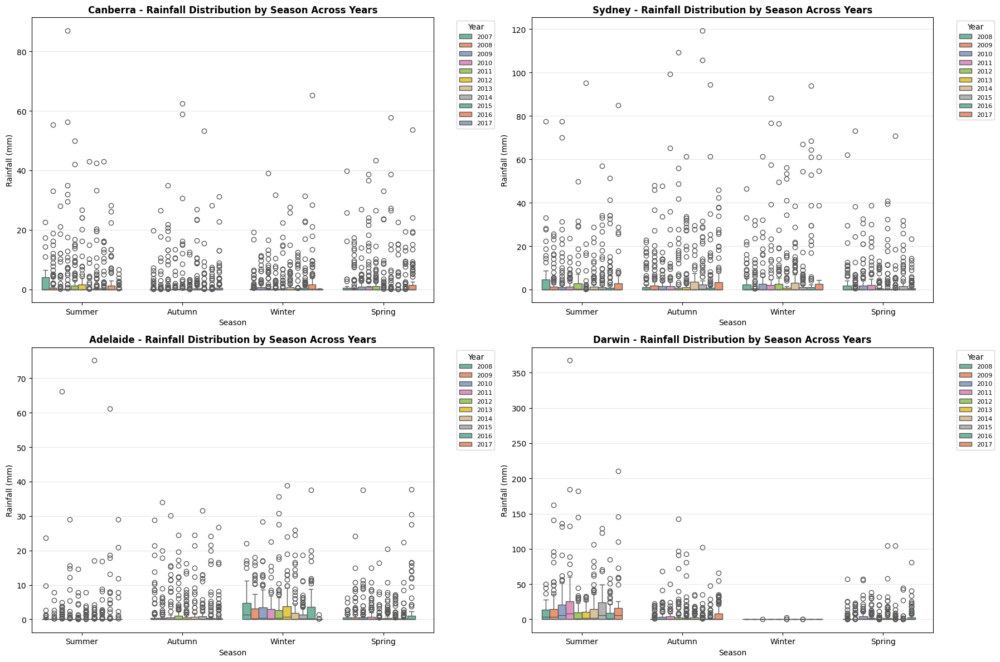

Box plot comparison across years completed


In [52]:
# 5. Box Plot: So sánh Distribution của mỗi Season qua các năm
selected_cities = data['Location'].value_counts().head(4).index

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Tạo combined column Year-Season
    city_data_copy = city_data.copy()
    city_data_copy['Year_Season'] = city_data_copy['Year'].astype(str) + '\n' + city_data_copy['Season']
    
    # Box plot
    sns.boxplot(data=city_data_copy, x='Season', y='Rainfall', hue='Year',
               ax=ax, palette='Set2', order=seasons_order)
    
    ax.set_title(f'{city} - Rainfall Distribution by Season Across Years', 
                fontsize=12, fontweight='bold')
    ax.set_xlabel('Season', fontsize=10)
    ax.set_ylabel('Rainfall (mm)', fontsize=10)
    ax.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("Box plot comparison across years completed")

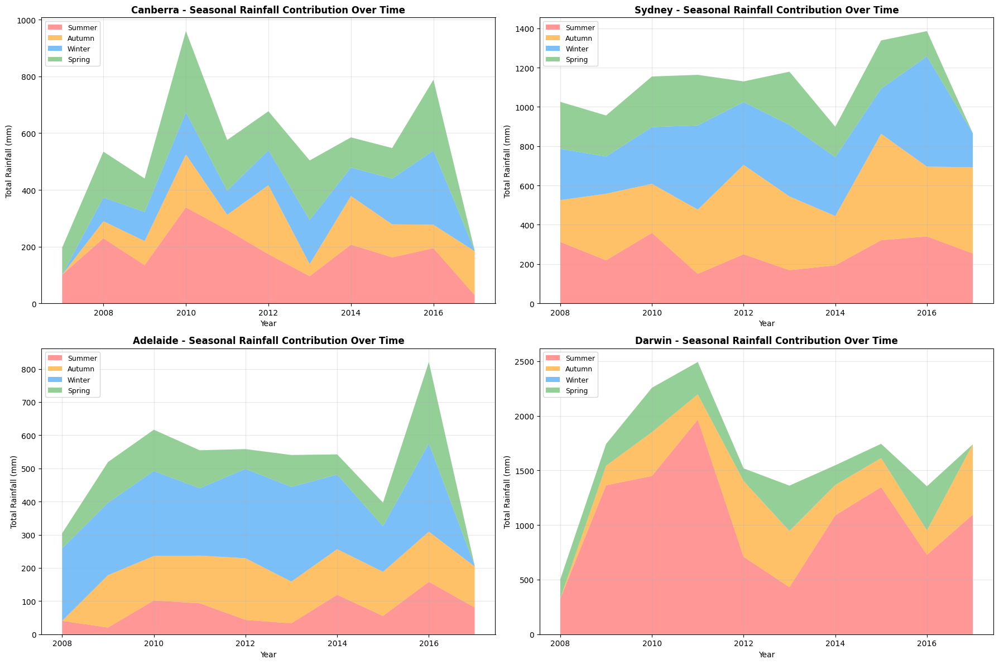

Stacked area chart for seasonal contribution completed


In [53]:
# 4. Stacked Area Chart: Seasonal Contribution qua các năm
selected_cities = data['Location'].value_counts().head(4).index

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Tính total rainfall cho mỗi year-season
    yearly_seasonal_total = city_data.groupby(['Year', 'Season'])['Rainfall'].sum().unstack(fill_value=0)
    yearly_seasonal_total = yearly_seasonal_total[seasons_order]
    
    # Stacked area plot
    ax.stackplot(yearly_seasonal_total.index, 
                yearly_seasonal_total['Summer'],
                yearly_seasonal_total['Autumn'],
                yearly_seasonal_total['Winter'],
                yearly_seasonal_total['Spring'],
                labels=seasons_order,
                colors=[season_colors[s] for s in seasons_order],
                alpha=0.7)
    
    ax.set_title(f'{city} - Seasonal Rainfall Contribution Over Time', 
                fontsize=12, fontweight='bold')
    ax.set_xlabel('Year', fontsize=10)
    ax.set_ylabel('Total Rainfall (mm)', fontsize=10)
    ax.legend(loc='upper left', fontsize=9)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("Stacked area chart for seasonal contribution completed")

=== SEASONAL TREND ANALYSIS ===


Canberra - Seasonal Trends (mm/year):
  Summer: Slope=-0.170 mm/year, R²=0.373, p-value=0.0461
  Autumn: Slope=0.088 mm/year, R²=0.142, p-value=0.2536
  Winter: Slope=0.089 mm/year, R²=0.139, p-value=0.2582
  Spring: Slope=-0.145 mm/year, R²=0.252, p-value=0.1155

Sydney - Seasonal Trends (mm/year):
  Summer: Slope=-0.007 mm/year, R²=0.000, p-value=0.9597
  Autumn: Slope=0.186 mm/year, R²=0.222, p-value=0.1698
  Winter: Slope=0.352 mm/year, R²=0.461, p-value=0.0309
  Spring: Slope=-0.194 mm/year, R²=0.370, p-value=0.0620

Adelaide - Seasonal Trends (mm/year):
  Summer: Slope=0.056 mm/year, R²=0.133, p-value=0.3005
  Autumn: Slope=0.051 mm/year, R²=0.065, p-value=0.4763
  Winter: Slope=-0.200 mm/year, R²=0.380, p-value=0.0577
  Spring: Slope=0.004 mm/year, R²=0.000, p-value=0.9638

Darwin - Seasonal Trends (mm/year):
  Summer: Slope=-0.106 mm/year, R²=0.005, p-value=0.8500
  Autumn: Slope=0.333 mm/year, R²=0.187, p-value=0.2119
  Winter: Slope=0.000 mm/

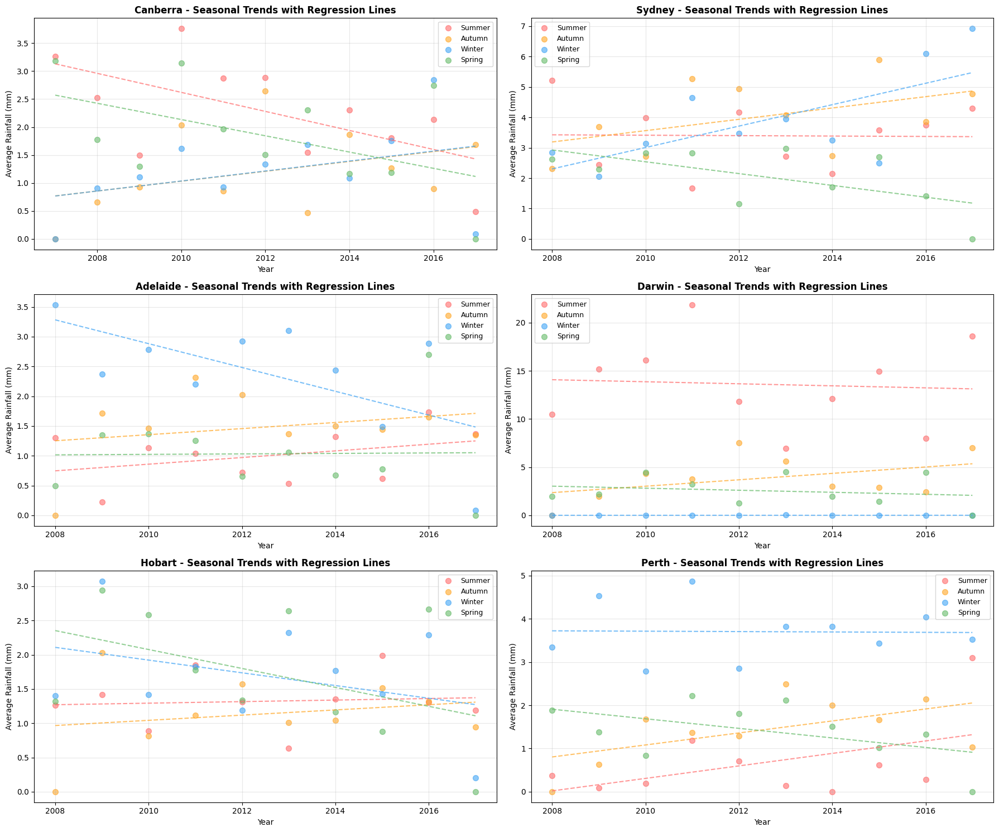


Trend analysis with regression completed


In [54]:
# 3. Trend Analysis với Linear Regression cho từng Season
from scipy import stats

selected_cities = data['Location'].value_counts().head(6).index

fig, axes = plt.subplots(3, 2, figsize=(18, 15))
axes = axes.flatten()

print("=== SEASONAL TREND ANALYSIS ===\n")

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Tính yearly average cho mỗi season
    yearly_seasonal = city_data.groupby(['Year', 'Season'])['Rainfall'].mean().unstack(fill_value=0)
    yearly_seasonal = yearly_seasonal[seasons_order]
    
    print(f"\n{city} - Seasonal Trends (mm/year):")
    
    # Plot và tính trend cho mỗi season
    for season in seasons_order:
        years = yearly_seasonal.index.values
        values = yearly_seasonal[season].values
        
        # Linear regression
        slope, intercept, r_value, p_value, std_err = stats.linregress(years, values)
        
        # Plot scatter và trend line
        ax.scatter(years, values, alpha=0.6, s=50, 
                  color=season_colors[season], label=f'{season}')
        trend_line = slope * years + intercept
        ax.plot(years, trend_line, '--', linewidth=1.5, 
               color=season_colors[season], alpha=0.7)
        
        # Print statistics
        print(f"  {season}: Slope={slope:.3f} mm/year, R²={r_value**2:.3f}, p-value={p_value:.4f}")
    
    ax.set_title(f'{city} - Seasonal Trends with Regression Lines', 
                fontsize=12, fontweight='bold')
    ax.set_xlabel('Year', fontsize=10)
    ax.set_ylabel('Average Rainfall (mm)', fontsize=10)
    ax.legend(loc='best', fontsize=9)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\nTrend analysis with regression completed")

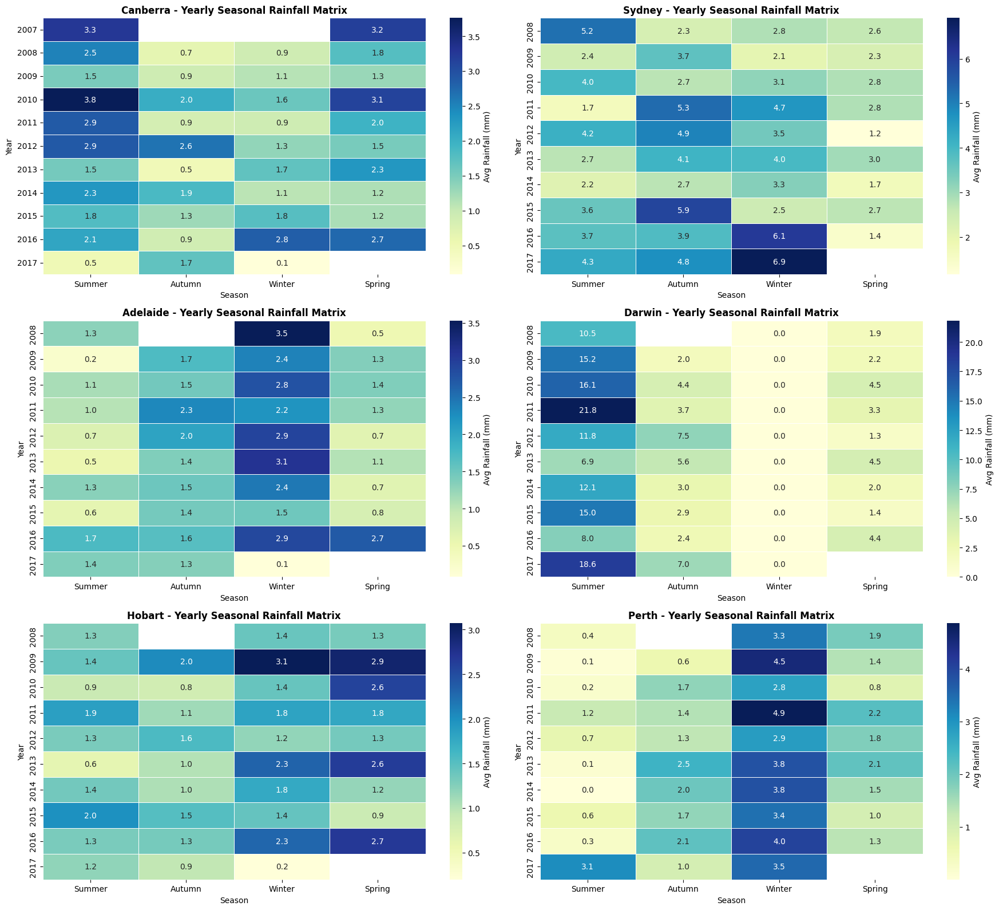

Year-Season matrix heatmap completed


In [55]:
# 2. Heatmap: Year x Season Matrix cho từng thành phố
selected_cities = data['Location'].value_counts().head(6).index

fig, axes = plt.subplots(3, 2, figsize=(18, 16))
axes = axes.flatten()

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Pivot table: Year x Season
    yearly_seasonal_matrix = city_data.pivot_table(
        values='Rainfall',
        index='Year',
        columns='Season',
        aggfunc='mean'
    )[seasons_order]
    
    # Heatmap
    sns.heatmap(yearly_seasonal_matrix, annot=True, fmt='.1f', 
               cmap='YlGnBu', ax=ax, cbar_kws={'label': 'Avg Rainfall (mm)'},
               linewidths=0.5, linecolor='white')
    
    ax.set_title(f'{city} - Yearly Seasonal Rainfall Matrix', fontsize=12, fontweight='bold')
    ax.set_xlabel('Season', fontsize=10)
    ax.set_ylabel('Year', fontsize=10)

plt.tight_layout()
plt.show()

print("Year-Season matrix heatmap completed")

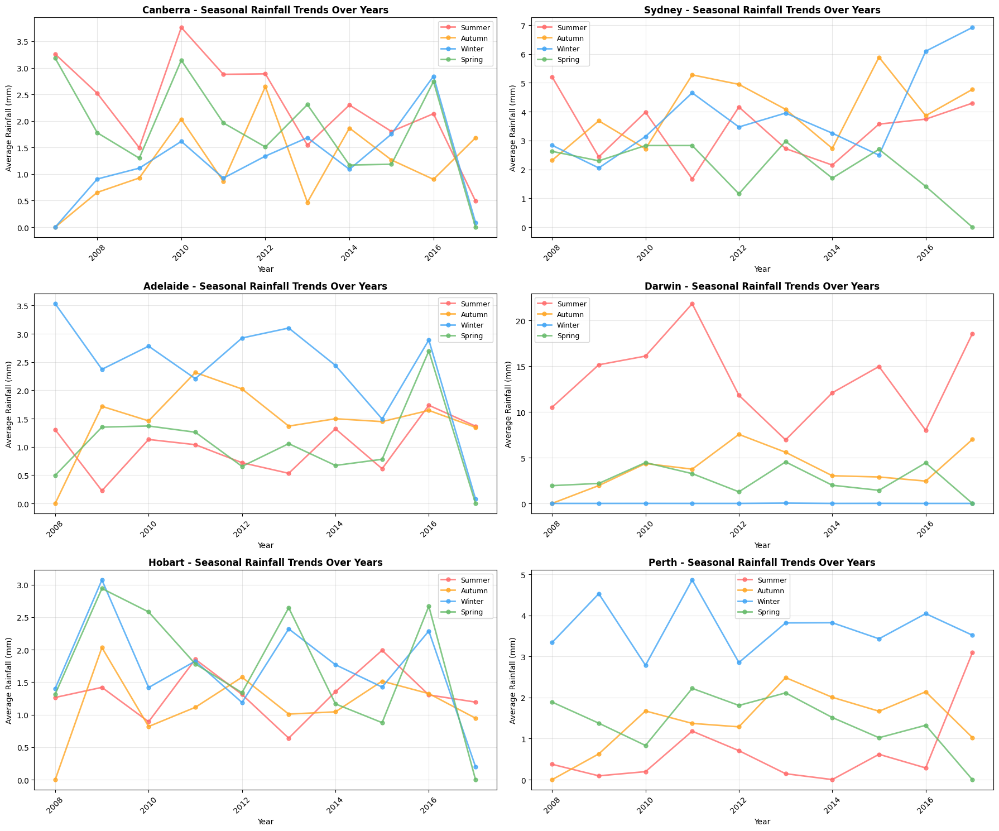

Seasonal trends over years visualization completed


In [56]:
# 1. Line Plot: Seasonal Rainfall Trends Over Years cho từng thành phố
selected_cities = data['Location'].value_counts().head(6).index

fig, axes = plt.subplots(3, 2, figsize=(18, 15))
axes = axes.flatten()

seasons_order = ['Summer', 'Autumn', 'Winter', 'Spring']
season_colors = {'Summer': '#FF6B6B', 'Autumn': '#FFA726', 'Winter': '#42A5F5', 'Spring': '#66BB6A'}

for idx, city in enumerate(selected_cities):
    ax = axes[idx]
    city_data = data[data['Location'] == city]
    
    # Tính average rainfall cho mỗi year-season combination
    yearly_seasonal = city_data.groupby(['Year', 'Season'])['Rainfall'].mean().unstack(fill_value=0)
    yearly_seasonal = yearly_seasonal[seasons_order]
    
    # Plot line cho mỗi season
    for season in seasons_order:
        ax.plot(yearly_seasonal.index, yearly_seasonal[season], 
               marker='o', linewidth=2, label=season, color=season_colors[season], 
               markersize=5, alpha=0.8)
    
    ax.set_title(f'{city} - Seasonal Rainfall Trends Over Years', fontsize=12, fontweight='bold')
    ax.set_xlabel('Year', fontsize=10)
    ax.set_ylabel('Average Rainfall (mm)', fontsize=10)
    ax.legend(loc='best', fontsize=9)
    ax.grid(alpha=0.3)
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

print("Seasonal trends over years visualization completed")

## Phân tích Seasonal Patterns qua nhiều năm - Temporal Trend Analysis